# Multi Modal Model Training - Dependent Labels

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime
import re
import emoji

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
import transformers
from transformers import BertTokenizer, BertModel, BertConfig, AdamW
from transformers import DistilBertTokenizer, DistilBertModel, DistilBertConfig
from transformers import pipeline

In [3]:
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler, RandomSampler, SequentialSampler, ConcatDataset
from sklearn.model_selection import KFold
import skimage

## Setup

In [4]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [5]:
one_hot.classes_

array(['Appeal to (Strong) Emotions', 'Appeal to authority',
       'Appeal to fear/prejudice', 'Bandwagon',
       'Black-and-white Fallacy/Dictatorship',
       'Causal Oversimplification', 'Doubt', 'Exaggeration/Minimisation',
       'Flag-waving', 'Glittering generalities (Virtue)',
       'Loaded Language',
       "Misrepresentation of Someone's Position (Straw Man)",
       'Name calling/Labeling',
       'Obfuscation, Intentional vagueness, Confusion',
       'Presenting Irrelevant Data (Red Herring)', 'Reductio ad hitlerum',
       'Repetition', 'Slogans', 'Smears', 'Thought-terminating cliché',
       'Transfer', 'Whataboutism'], dtype=object)

In [6]:
from CustomLoader import MultiModalLoader

In [7]:
training_data = MultiModalLoader(json_file = 'MultiModal_training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = MultiModalLoader(json_file = 'MultiModal_testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [8]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 
# 

## Initialize Tokenizer

In [9]:
do_lower_case = True
model_type = 'distilbert'
model_version = 'distilbert-base-uncased'
tokenizer = DistilBertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)

# 
# 

## Define DistilBert Class

In [10]:
class DistilBertClass(nn.Module): ### INCLUDE TOKENIZER IN CLASS
    def __init__(self):
        super(DistilBertClass, self).__init__()
        
        ### Import DistilBert Model
        distilbert = transformers.DistilBertModel.from_pretrained("distilbert-base-uncased")
        
        ### Freeze parameters
        for param in distilbert.parameters():
            param.requires_grad = False
            
        ### DistilBert encoder
        self.distil = distilbert
                        
            
        self.pre_classifier = nn.Linear(770, 3072) #768
        
        self.fc2 = nn.Linear(3072, 1024)    
        self.fc3 = nn.Linear(1024, 512)
        self.fc4 = nn.Linear(512, 128)
        
#         self.classifier = nn.Linear(128, 22)
        
        self.dropout = nn.Dropout(0.01) #.3
        
        
    def forward(self, input_ids, attention_mask, hate, sent):

        ### Run DistilBert
        distil_output = self.distil(input_ids = input_ids, attention_mask = attention_mask)

        ### Grab hidden state
        hidden_state = distil_output[0]
        x1 = hidden_state[:, 0]
        

        # prepare hidden state to append additional features (hate and sentiment; hotencoded)
        x1 = x1.view(x1.size(0), -1)
        
        ### Bring in hate and sentiment
        x2 = hate
        x3 = sent

        ### Concatenate hidden state, hate, and sentiment
        x = torch.cat((x1, x2, x3), dim=1)

        ### Run through linear layers
        fc_output = x
        fc_output = self.pre_classifier(fc_output)

        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)

        fc_output = self.fc2(fc_output)
        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)

        #GELU

        fc_output = self.fc3(fc_output)
        fc_output = nn.GELU()(fc_output)
        fc_output = self.dropout(fc_output)


        fc_output = self.fc4(fc_output)
        fc_output = nn.Tanh()(fc_output)  # using gelu except for the last one to allow for classification
        fc_output = self.dropout(fc_output)

#         output = self.classifier(fc_output)


        return fc_output

# 
# 
# 

## Define CNN-RNN-DB Architectures (Set Hidden Size)

### ResNet18-LSTM-DB

In [11]:
### Define Class
class ResNet18_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM-DB

In [12]:
### Define Class
class ResNet50_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM-DB

In [13]:
### Define Class
class ResNet101_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM-DB

In [14]:
### Define Class
class DenseNet121_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM-DB

In [15]:
### Define Class
class DenseNet169_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM-DB

In [16]:
### Define Class
class DenseNet201_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
                
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM-DB

In [17]:
### Define Class
class VGG11_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM-DB

In [18]:
### Define Class
class VGG16_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM-DB

In [19]:
### Define Class
class VGG19_BN_LSTM_DB(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM_DB, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size + 128, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images, distil_emb):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Concatenate DistilBert embeddings
        emb = torch.cat((image_emb, distil_emb), dim=1)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [20]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [21]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN_DB(CNN = None, DistilBert = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((CNN == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None) or (DistilBert == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network1 = DistilBert
            network2 = CNN
            if torch.cuda.is_available():
                network1.cuda()
                network1 = nn.DataParallel(network1, list(range(2)))
                
                network2.cuda()
                network2 = nn.DataParallel(network2, list(range(2)))
                
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer1 = transformers.Adafactor(
                network1.parameters(),
                lr=None,  # when using warm up and relative step, LR is auto determined
                eps=(1e-30, 1e-3),
                clip_threshold=1.0,
                decay_rate=-0.8, #0.8
                beta1=None, # <- used for L1 regularization
                weight_decay=0.000002, # L2 regularization, to prevent overfitting  (beta2)
                relative_step=True,
                scale_parameter=True, # https://github.com/pytorch/pytorch/issues/25081 this setting keeps the gradients from reaching 0 (using the clip threshold) (if this is enabled, must modify in training)
                warmup_init=True
            )
                        
            optimizer2 = optim.Adam(network2.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer2, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network1.train()
                network2.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, text, hate, sent, targets = data[0].to(device), data[1], data[2].to(device), data[3].to(device), data[4].float().to(device)
                    
                    optimizer1.zero_grad()
                    optimizer2.zero_grad()
                    
                    
                    ids = []
                    mask = []

                    for j in text:   
                        inputs = tokenizer.encode_plus(
                                j, 
                                None,
                                add_special_tokens = True,    
                                max_length= 512,
                                padding = "max_length",
                                pad_to_max_length = True,
                                return_token_type_ids= False)

                        ids.append(inputs['input_ids'])
                        mask.append(inputs['attention_mask'])

                    ids = torch.from_numpy(np.array(ids)).to(device)
                    mask = torch.from_numpy(np.array(mask)).to(device)

                    distil_output = network1(ids, mask, hate, sent)

                    output = network2(images, distil_output)

                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer1.step()
                    optimizer2.step()
                    
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network1.eval()
                network2.eval()
                
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, text, hate, sent, targets = data[0].to(device), data[1], data[2].to(device), data[3].to(device), data[4].float().to(device)
                    
                    ids = []
                    mask = []
                    
                    for j in text:   
                        inputs = tokenizer.encode_plus(
                                j, 
                                None,
                                add_special_tokens = True,    
                                max_length= 512,
                                padding = "max_length",
                                pad_to_max_length = True,
                                return_token_type_ids= False)

                        ids.append(inputs['input_ids'])
                        mask.append(inputs['attention_mask'])

                    ids = torch.from_numpy(np.array(ids)).to(device)
                    mask = torch.from_numpy(np.array(mask)).to(device)

                    distil_output = network1(ids, mask, hate, sent)

                    output = network2(images, distil_output)
                    
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network1.state_dict(), 'BestCnnRnnDBModels/DB_' + model_name[:-3] + '.pt')
                    torch.save(network2.state_dict(), 'BestCnnRnnDBModels/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer2), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('MultiModal_DependentLabels_700_1_50_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 50%

In [22]:
DB_resnet18 = DistilBertClass()
DB_resnet50 = DistilBertClass()
DB_resnet101 = DistilBertClass()

DB_densenet121 = DistilBertClass()
DB_densenet169 = DistilBertClass()
DB_densenet201 = DistilBertClass()

DB_vgg11bn = DistilBertClass()
DB_vgg16bn = DistilBertClass()
DB_vgg19bn = DistilBertClass()

resnet18LSTM_700_1_50 = ResNet18_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet50LSTM_700_1_50 = ResNet50_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet101LSTM_700_1_50 = ResNet101_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)

densenet121LSTM_700_1_50 = DenseNet121_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet169LSTM_700_1_50 = DenseNet169_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet201LSTM_700_1_50 = DenseNet201_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_700_1_50 = VGG11_BN_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_700_1_50 = VGG16_BN_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_700_1_50 = VGG19_BN_LSTM_DB(hiddenSize = 700, numLayers = 1, dpout = 0.5)

# 
# 

## Train Models

In [23]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0174 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0626 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0363 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1373 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1019 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0405 	Validation Recall Micro: 0.0
Train Recall Marco: 0.031 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.56
Train Loss: 0.0127 	Validation Loss: 0.0017
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

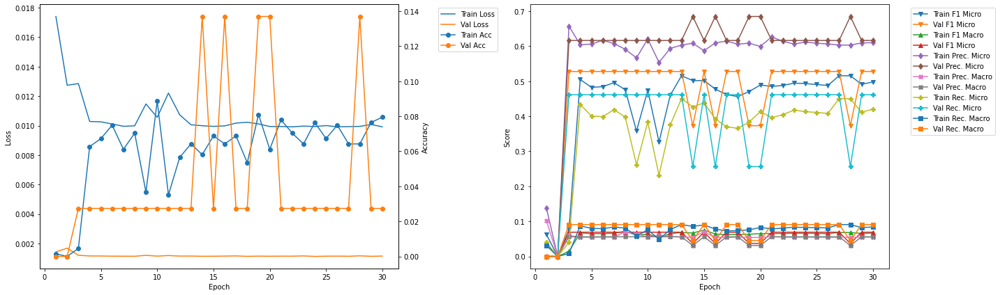

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.02
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5123 	Validation F1 Micro: 0.4754
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4405 	Validation Recall Micro: 0.4121
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.27
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0734 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5022 	Validation F1 Micro: 0.4754
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6221 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.056 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4211 	V

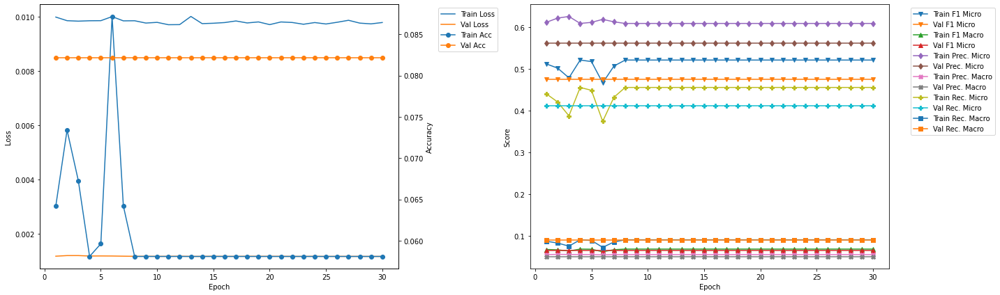

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.527859 --> 0.557185).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 15.71
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4691 	Validation F1 Micro: 0.5572
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3796 	Validation Recall Micro: 0.4872
Train Recall Marco: 0.0755 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.97
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4589 	Validation F1 Micro: 0.5572
Train F1 Marco: 0.0619 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.6186 	Validation Precision Micro: 0.6507
Train Precision

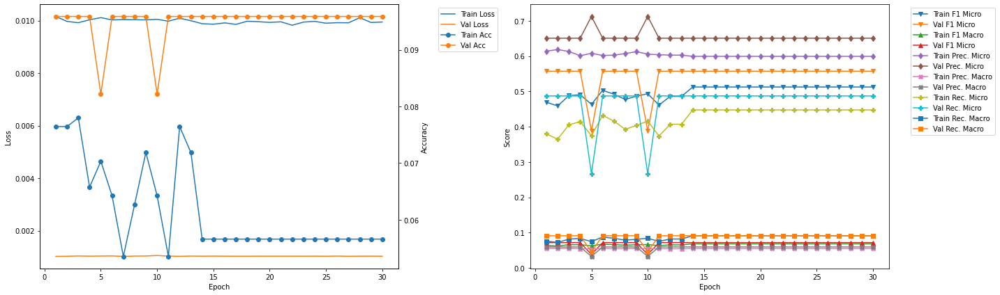

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.4
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4912 	Validation F1 Micro: 0.5422
Train F1 Marco: 0.066 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.055 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4106 	Validation Recall Micro: 0.4839
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.66
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5142 	Validation F1 Micro: 0.5422
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6032 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.448 	Validati

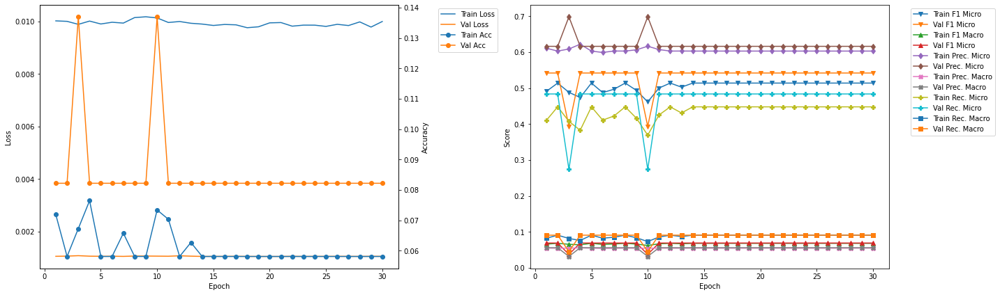

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.1
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5042 	Validation F1 Micro: 0.4896
Train F1 Marco: 0.067 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4289 	Validation Recall Micro: 0.4339
Train Recall Marco: 0.0854 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.36
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4884 	Validation F1 Micro: 0.4896
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0653
Train Precision Mirco: 0.6231 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4016 

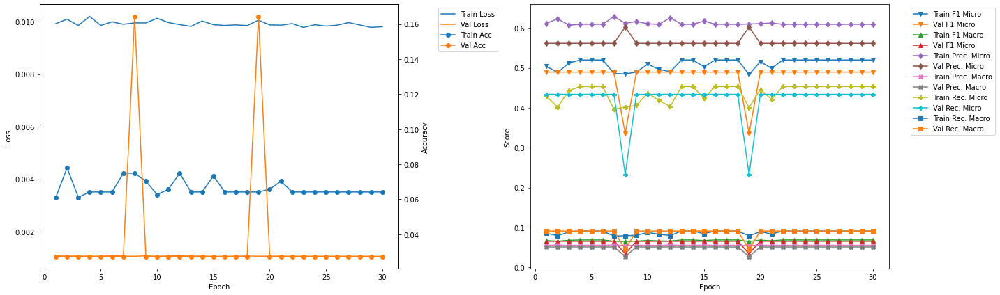

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.79
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5114 	Validation F1 Micro: 0.3546
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.037
Train Precision Mirco: 0.61 	Validation Precision Micro: 0.6849
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0311
Train Recall Mirco: 0.4402 	Validation Recall Micro: 0.2392
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.05
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0856 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4917 	Validation F1 Micro: 0.4901
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4097 

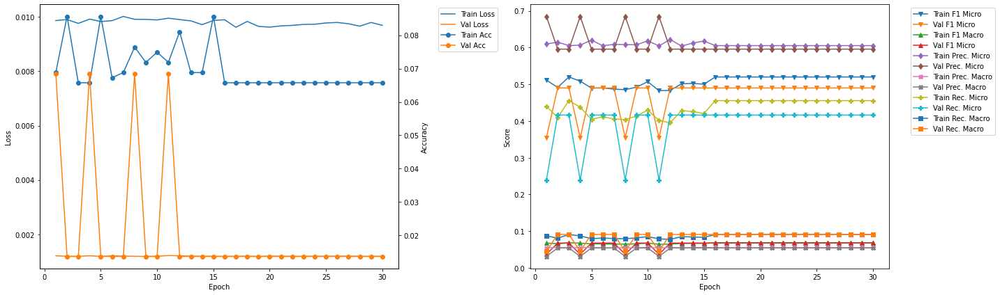

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.5
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4867 	Validation F1 Micro: 0.5145
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4047 	Validation Recall Micro: 0.445
Train Recall Marco: 0.0803 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.76
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4948 	Validation F1 Micro: 0.5145
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4184 

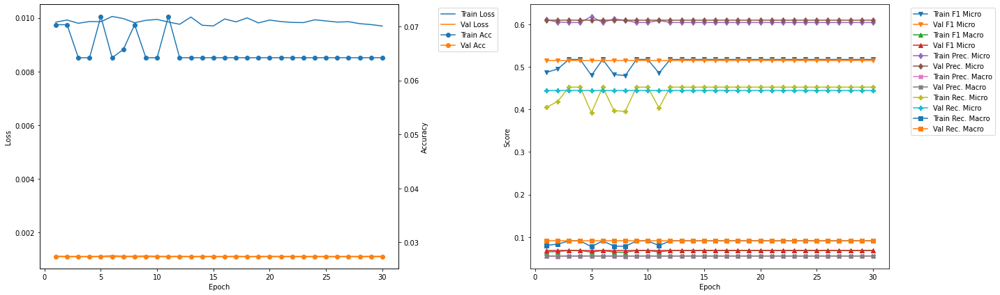

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.2
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4862 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6203 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.3998 	Validation Recall Micro: 0.4409
Train Recall Marco: 0.079 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.45
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4889 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.4055 	

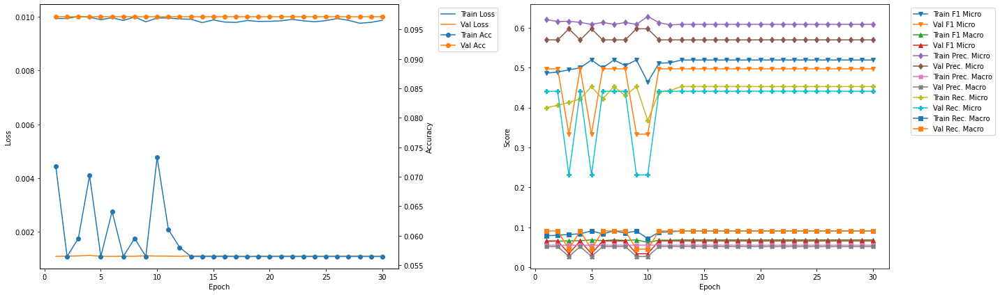

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 61.89
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5071 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4358 	Validation Recall Micro: 0.4536
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 62.15
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5165 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.45

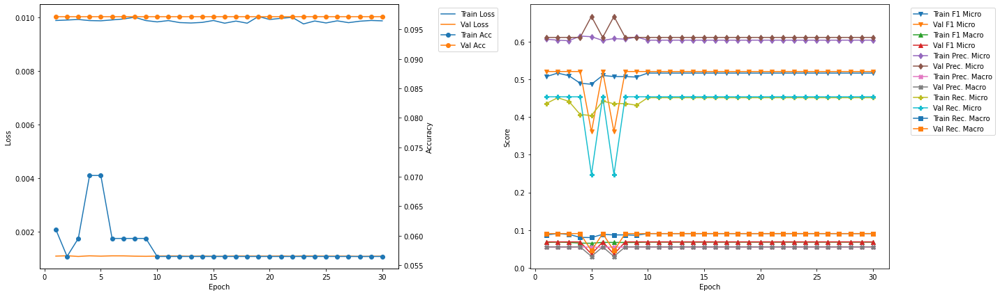

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.58
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4916 	Validation F1 Micro: 0.3835
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0377
Train Precision Mirco: 0.611 	Validation Precision Micro: 0.7083
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0322
Train Recall Mirco: 0.4113 	Validation Recall Micro: 0.2629
Train Recall Marco: 0.0826 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.84
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0748 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4778 	Validation F1 Micro: 0.5562
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0717
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.6528
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0593
Train Recall Mirco: 0.3936 	Va

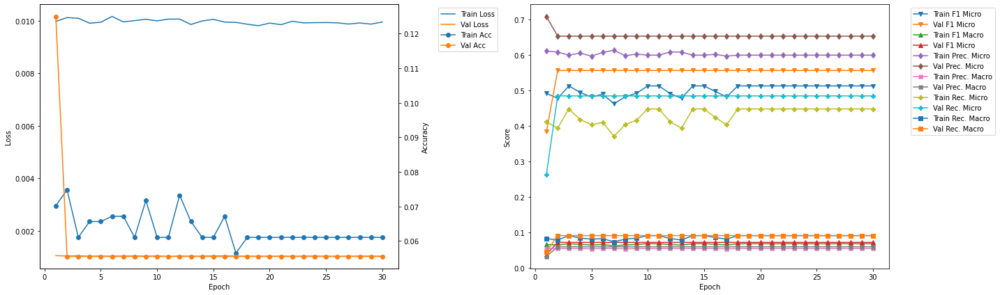

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4691 	Validation F1 Micro: 0.5572
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.614 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.3796 	Validation Recall Micro: 0.4872
Train Recall Marco: 0.0755 	Validation Recall Macro: 0.0909


In [24]:
resnet18LSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = resnet18LSTM_700_1_50, DistilBert = DB_resnet18,
                                                training_data = training_data, learning_rate = 0.01,
                                                k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0171 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0514 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0381 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1135 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1065 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0333 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0328 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.56
Train Loss: 0.0123 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

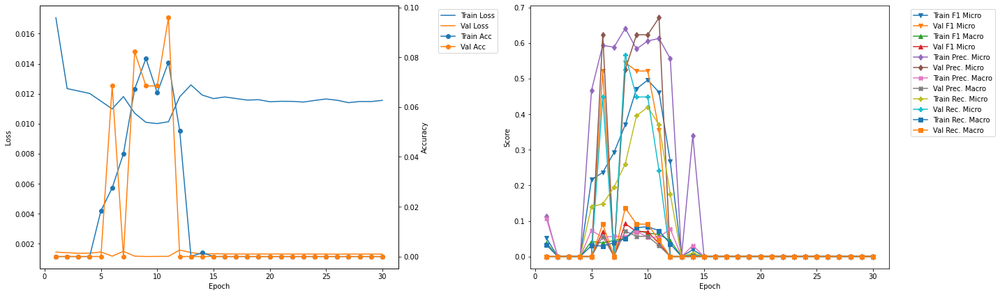

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.65
Train Loss: 0.0118 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0202 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0036 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.36 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0327 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0104 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0019 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.92
Train Loss: 0.0117 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

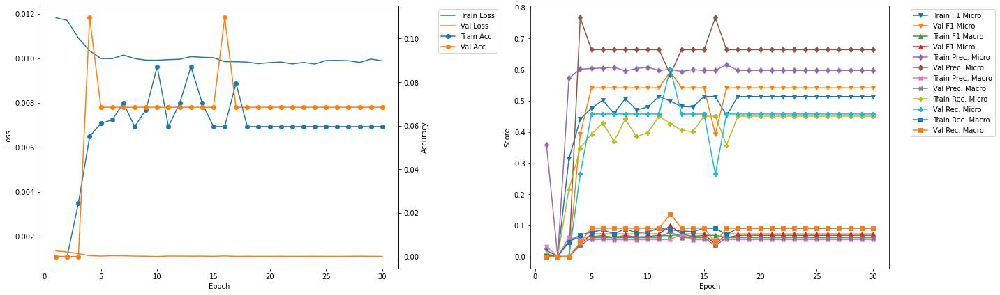

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.03
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4905 	Validation F1 Micro: 0.3616
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4111 	Validation Recall Micro: 0.2475
Train Recall Marco: 0.0821 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.3
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.487 	Validation F1 Micro: 0.3616
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4077 	

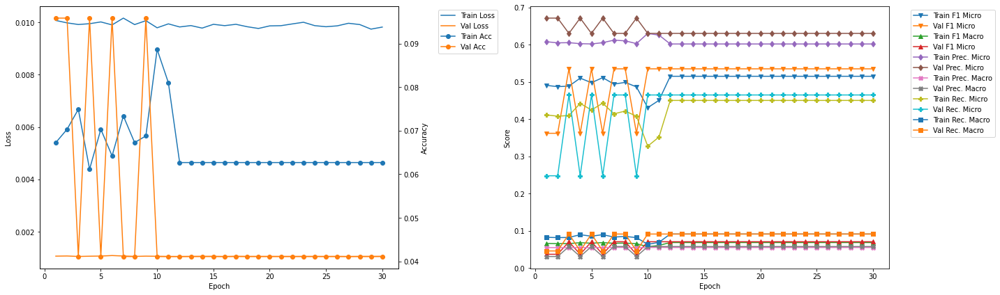

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.37
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5069 	Validation F1 Micro: 0.3494
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.6005 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.4386 	Validation Recall Micro: 0.2398
Train Recall Marco: 0.0884 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.65
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4706 	Validation F1 Micro: 0.538
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6248 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3775 

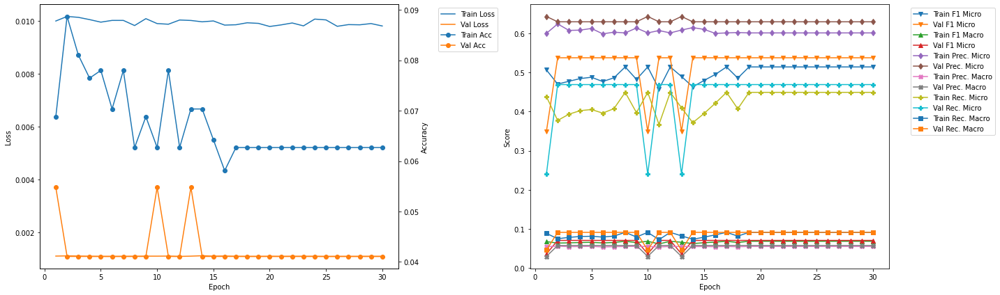

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.72
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.508 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6089 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4357 	Validation Recall Micro: 0.4444
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.99
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5097 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0662
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.4408 

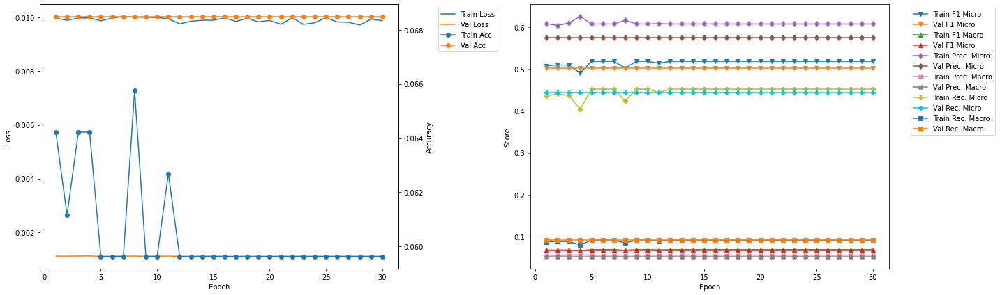

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.06
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5205 	Validation F1 Micro: 0.4834
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0639
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.4535 	Validation Recall Micro: 0.4324
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.34
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5179 	Validation F1 Micro: 0.4834
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0639
Train Precision Mirco: 0.6067 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0743 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.45

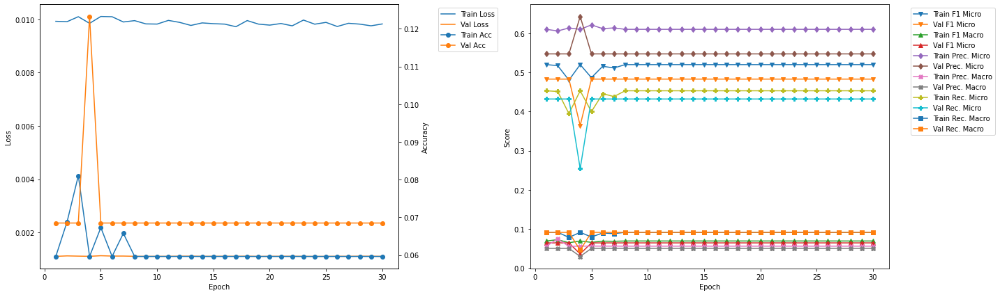

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.41
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5068 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4353 	Validation Recall Micro: 0.4381
Train Recall Marco: 0.087 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.69
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5188 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0665
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4529 	Vali

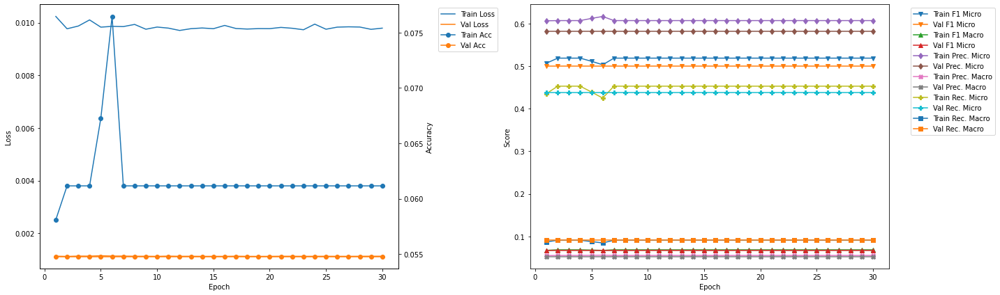

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 58.76
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5 	Validation F1 Micro: 0.5488
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.593 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0691 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4322 	Validation Recall Micro: 0.4891
Train Recall Marco: 0.0883 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.04
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4755 	Validation F1 Micro: 0.5488
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0697
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.625
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3874 	Valid

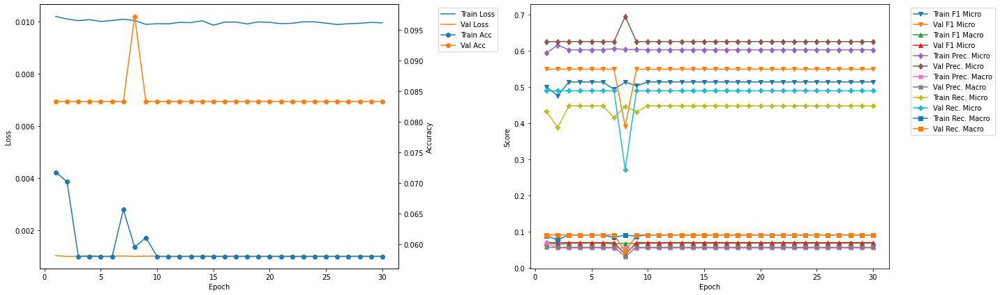

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 67.11
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4785 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6088 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3942 	Validation Recall Micro: 0.4536
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 67.39
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5165 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4512 	

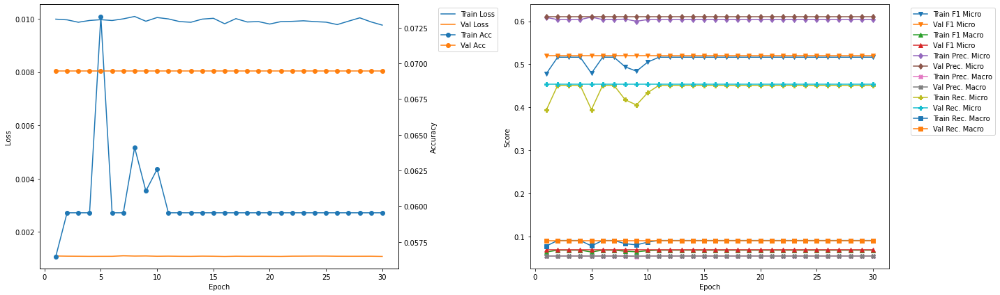

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 75.46
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5104 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.6178 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.4348 	Validation Recall Micro: 0.4167
Train Recall Marco: 0.0863 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 75.74
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5214 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.4

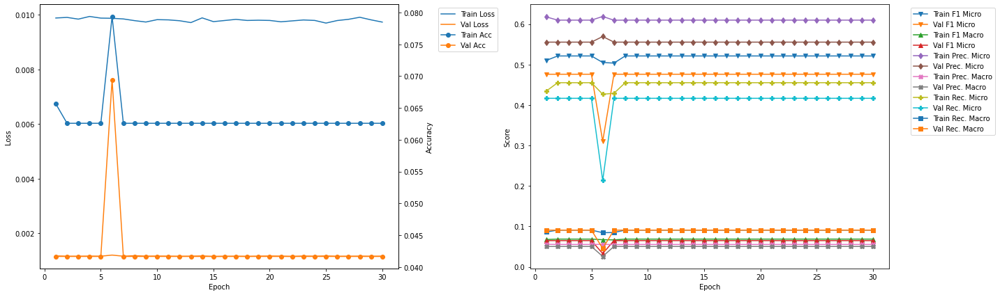

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 12
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4993 	Validation F1 Micro: 0.594
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0993
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.5845
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0797
Train Recall Mirco: 0.4271 	Validation Recall Micro: 0.6038
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.1364


In [25]:
resnet50LSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = resnet50LSTM_700_1_50, DistilBert = DB_resnet50, 
                                                training_data = training_data, learning_rate = 0.01, 
                                                k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0173 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0933 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1333 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1265 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0717 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0793 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.61
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

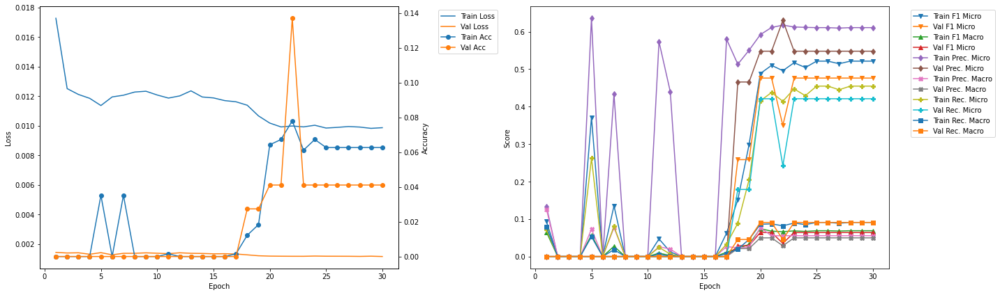

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.476190 --> 0.476190).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.48
Train Loss: 0.0126 	Validation Loss: 0.0012
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0316 	Validation F1 Micro: 0.4762
Train F1 Marco: 0.0061 	Validation F1 Macro: 0.0925
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.3793
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0688
Train Recall Mirco: 0.0163 	Validation Recall Micro: 0.6395
Train Recall Marco: 0.0033 	Validation Recall Macro: 0.1802

Validation F1 Micro Score Increased (0.476190 --> 0.503145).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.79
Train Loss: 0.0104 	Validation Loss: 0.001
Train Accuracy: 0.0489 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4661 	Validation F1 Micro: 0.5031
Train F1 Marco: 0.0746 	Validation F1 Macro: 0.0643
Train Pr

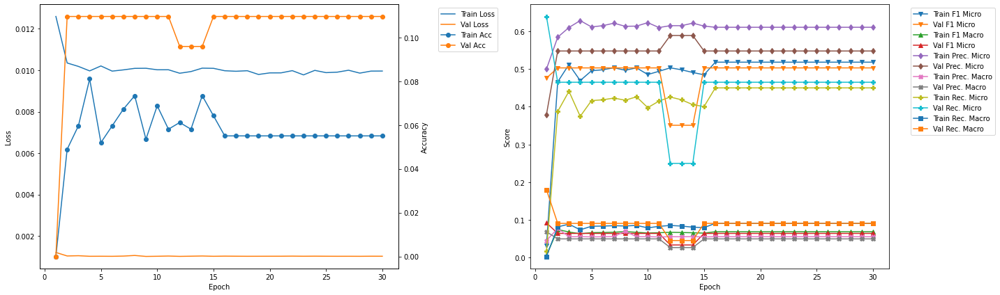

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.503145 --> 0.517241).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.64
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4925 	Validation F1 Micro: 0.5172
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4132 	Validation Recall Micro: 0.4455
Train Recall Marco: 0.0827 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.94
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4983 	Validation F1 Micro: 0.3927
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0387
Train Precision Mirco: 0.6029 	Validation Precision Micro: 0.7397
Train Precisi

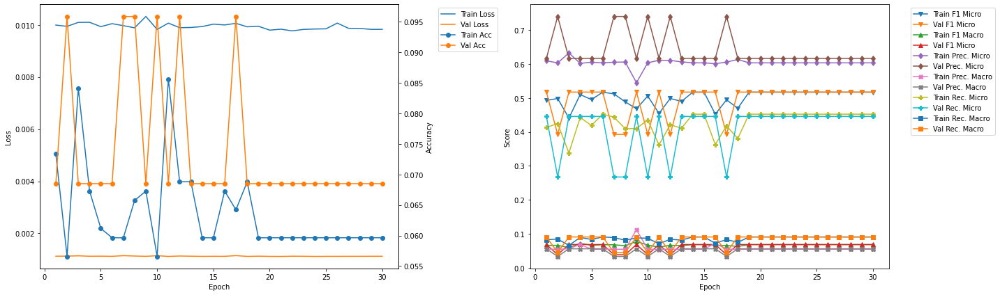

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.517241 --> 0.567335).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 27.78
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4712 	Validation F1 Micro: 0.5673
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0733
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.3853 	Validation Recall Micro: 0.4877
Train Recall Marco: 0.0769 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.09
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4635 	Validation F1 Micro: 0.5673
Train F1 Marco: 0.0709 	Validation F1 Macro: 0.0733
Train Precision Mirco: 0.5966 	Validation Precision Micro: 0.6781
Train Prec

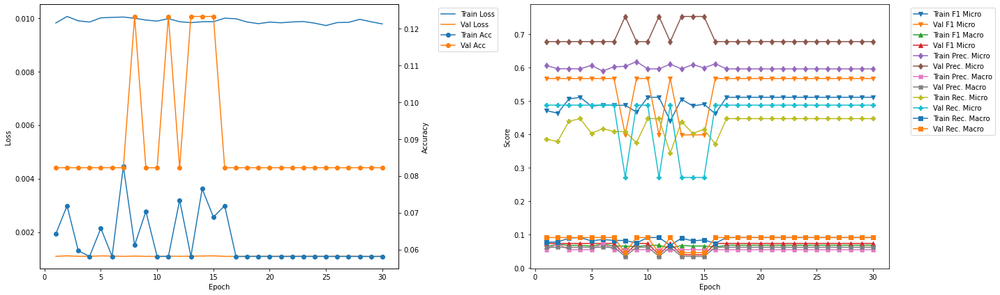

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.92
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0841 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4708 	Validation F1 Micro: 0.511
Train F1 Marco: 0.0629 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6113 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3829 	Validation Recall Micro: 0.4266
Train Recall Marco: 0.075 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.22
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0566 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5055 	Validation F1 Micro: 0.3711
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0387
Train Precision Mirco: 0.6013 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0336
Train Recall Mirco: 0.4361 

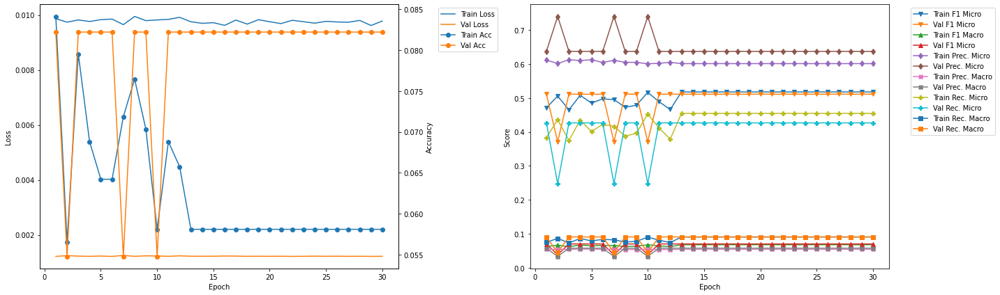

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.05
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4873 	Validation F1 Micro: 0.5471
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.407 	Validation Recall Micro: 0.4918
Train Recall Marco: 0.0818 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.36
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5043 	Validation F1 Micro: 0.5471
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6069 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4314 	Valid

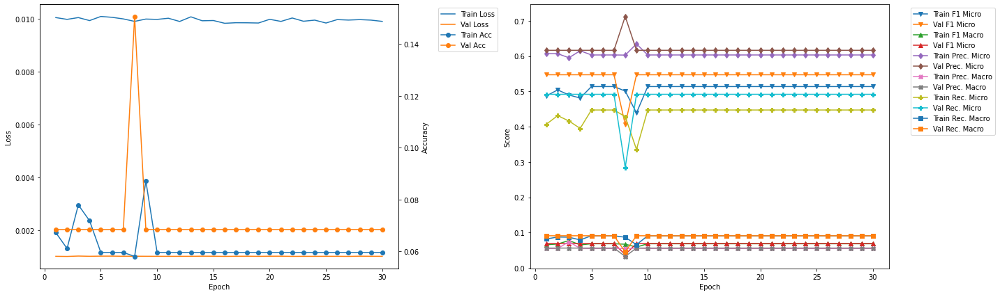

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.2
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.503 	Validation F1 Micro: 0.4838
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6167 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4247 	Validation Recall Micro: 0.4249
Train Recall Marco: 0.0842 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.51
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4643 	Validation F1 Micro: 0.4838
Train F1 Marco: 0.062 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.6263 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.3689 

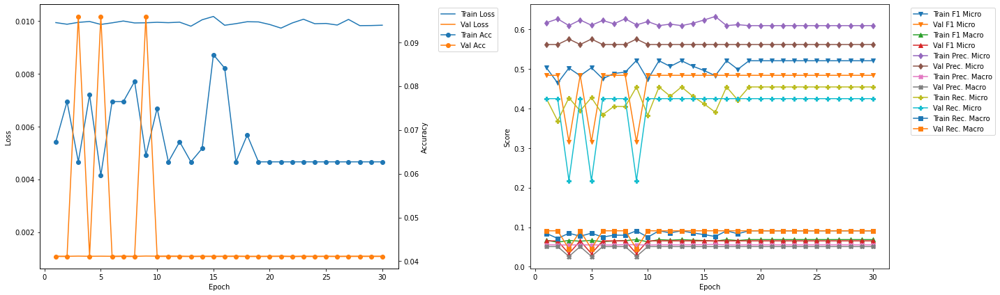

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 64.35
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4759 	Validation F1 Micro: 0.5364
Train F1 Marco: 0.0637 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6044 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.054 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.3924 	Validation Recall Micro: 0.4623
Train Recall Marco: 0.0779 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 64.65
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.5364
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4502 

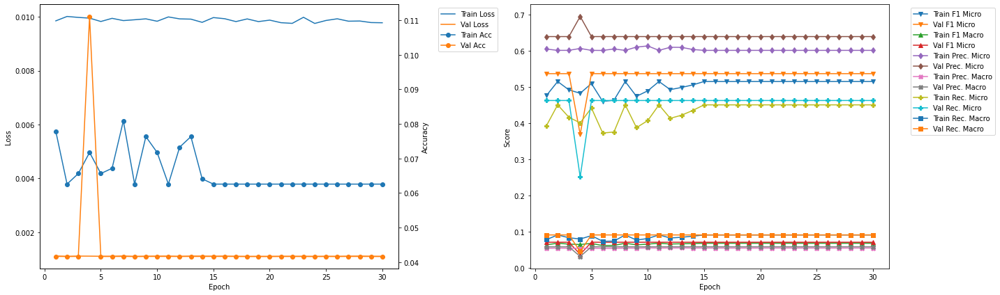

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 73.48
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0718 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4743 	Validation F1 Micro: 0.509
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6212 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.3836 	Validation Recall Micro: 0.4474
Train Recall Marco: 0.0754 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 73.78
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.4975 	Validation F1 Micro: 0.509
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0675
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.42 	Va

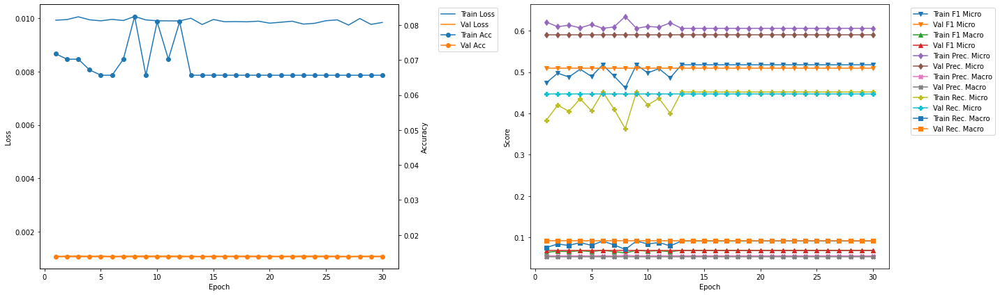

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 82.61
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0779 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4783 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.0641 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6162 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3909 	Validation Recall Micro: 0.4467
Train Recall Marco: 0.0771 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 82.92
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4811 	Validation F1 Micro: 0.5161
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0689
Train Precision Mirco: 0.6115 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3966

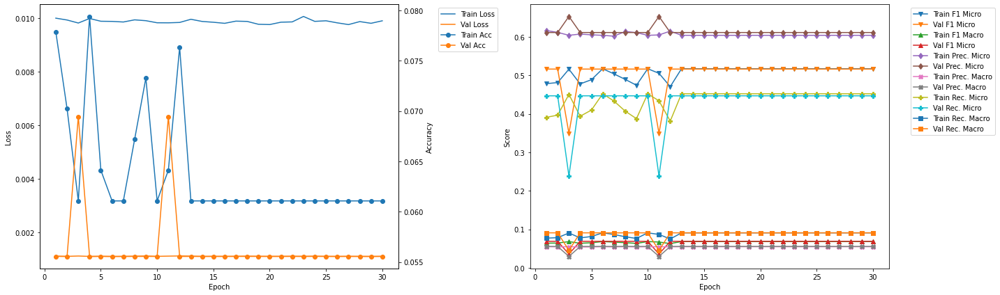

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 1
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4712 	Validation F1 Micro: 0.5673
Train F1 Marco: 0.0634 	Validation F1 Macro: 0.0733
Train Precision Mirco: 0.6065 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.3853 	Validation Recall Micro: 0.4877
Train Recall Marco: 0.0769 	Validation Recall Macro: 0.0909


In [26]:
resnet101LSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = resnet101LSTM_700_1_50, DistilBert = DB_resnet101, 
                                                 training_data = training_data, learning_rate = 0.01,
                                                 k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.023 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0636 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0443 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1001 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1132 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0466 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0436 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.6
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Vali

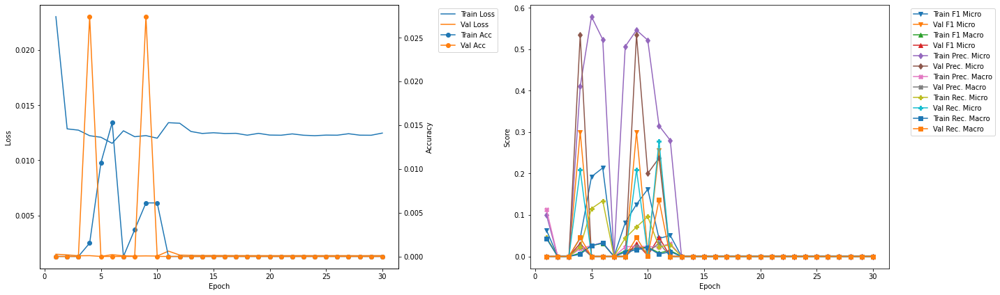

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.21
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.5
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0106
Train F1 Marco: 0.0026 	Validation F1 Macro: 0.0114
Train Precision Mirco: 0.6667 	Validation Precision Micro: 0.5
Train Precision Marco: 0.0303 	Validation Precision Macro: 0.0227
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0053
Train Recall Marco

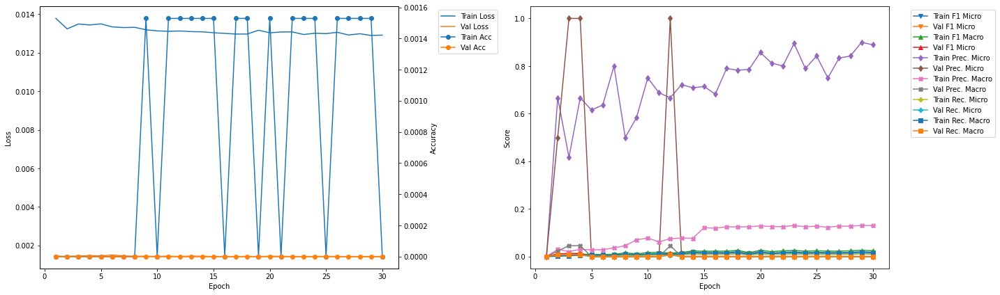

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.11
Train Loss: 0.0161 	Validation Loss: 0.0016
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0685 	Validation F1 Micro: 0.0208
Train F1 Marco: 0.0478 	Validation F1 Macro: 0.0341
Train Precision Mirco: 0.1736 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.1445 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0427 	Validation Recall Micro: 0.0106
Train Recall Marco: 0.0344 	Validation Recall Macro: 0.0227

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.41
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.019 	Validation F1 Micro: 0.0105
Train F1 Marco: 0.0194 	Validation F1 Macro: 0.0227
Train Precision Mirco: 0.5667 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0431 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0097 	Valida

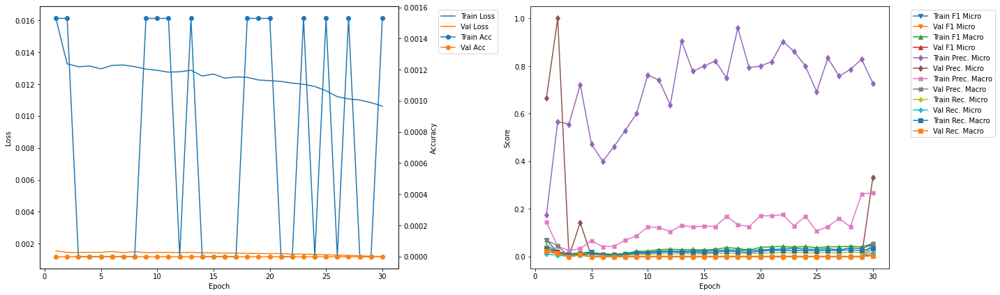

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.01
Train Loss: 0.0134 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.031 	Validation F1 Micro: 0.0317
Train F1 Marco: 0.0387 	Validation F1 Macro: 0.021
Train Precision Mirco: 0.6364 	Validation Precision Micro: 0.5
Train Precision Marco: 0.1945 	Validation Precision Macro: 0.0227
Train Recall Mirco: 0.0159 	Validation Recall Micro: 0.0164
Train Recall Marco: 0.0247 	Validation Recall Macro: 0.0195

Epoch 2 	Learning Rate: 0.01 	Time (min): 27.31
Train Loss: 0.0129 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0343 	Validation F1 Micro: 0.0323
Train F1 Marco: 0.0346 	Validation F1 Macro: 0.0384
Train Precision Mirco: 0.7045 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0918 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0176 	Validation Recal

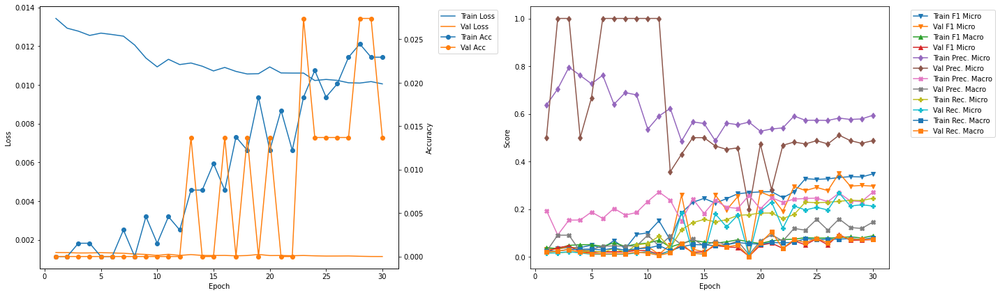

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.351254 --> 0.516667).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 35.94
Train Loss: 0.0113 	Validation Loss: 0.0012
Train Accuracy: 0.0076 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.1546 	Validation F1 Micro: 0.5167
Train F1 Marco: 0.0567 	Validation F1 Macro: 0.0835
Train Precision Mirco: 0.5215 	Validation Precision Micro: 0.6039
Train Precision Marco: 0.2111 	Validation Precision Macro: 0.1088
Train Recall Mirco: 0.0908 	Validation Recall Micro: 0.4515
Train Recall Marco: 0.0391 	Validation Recall Macro: 0.1044

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.24
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0245 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3098 	Validation F1 Micro: 0.0804
Train F1 Marco: 0.0817 	Validation F1 Macro: 0.025
Train Precision Mirco: 0.571 	Validation Precision Micro: 0.5
Train Precision Ma

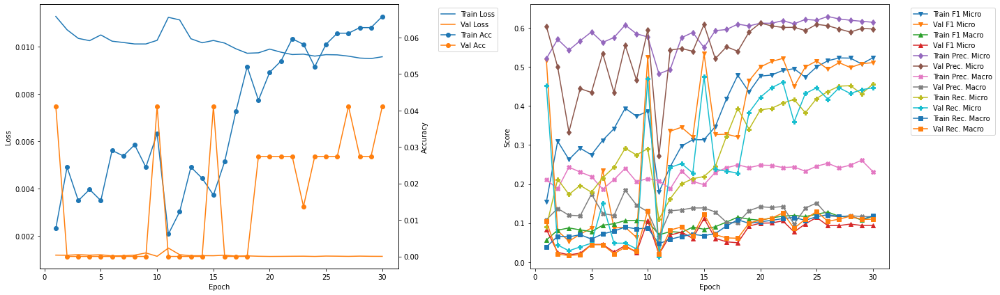

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.88
Train Loss: 0.0122 	Validation Loss: 0.0012
Train Accuracy: 0.0153 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1937 	Validation F1 Micro: 0.1659
Train F1 Marco: 0.0804 	Validation F1 Macro: 0.1279
Train Precision Mirco: 0.493 	Validation Precision Micro: 0.5758
Train Precision Marco: 0.239 	Validation Precision Macro: 0.2596
Train Recall Mirco: 0.1205 	Validation Recall Micro: 0.0969
Train Recall Marco: 0.0528 	Validation Recall Macro: 0.1099

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.17
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0107 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.2009 	Validation F1 Micro: 0.3986
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.1476
Train Precision Mirco: 0.5646 	Validation Precision Micro: 0.6333
Train Precision Marco: 0.2212 	Validation Precision Macro: 0.3085
Train Recall Mirco: 0.1222 	V

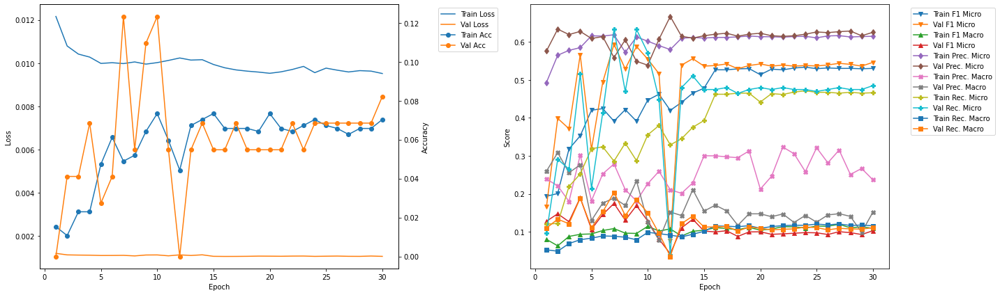

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 53.81
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.0428 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4369 	Validation F1 Micro: 0.5235
Train F1 Marco: 0.1133 	Validation F1 Macro: 0.1108
Train Precision Mirco: 0.5684 	Validation Precision Micro: 0.7063
Train Precision Marco: 0.2394 	Validation Precision Macro: 0.1797
Train Recall Mirco: 0.3549 	Validation Recall Micro: 0.4159
Train Recall Marco: 0.0998 	Validation Recall Macro: 0.1037

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.1
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4518 	Validation F1 Micro: 0.5667
Train F1 Marco: 0.101 	Validation F1 Macro: 0.1141
Train Precision Mirco: 0.6197 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.21 	Validation Precision Macro: 0.1751
Train Recall Mirco: 0.3555 	

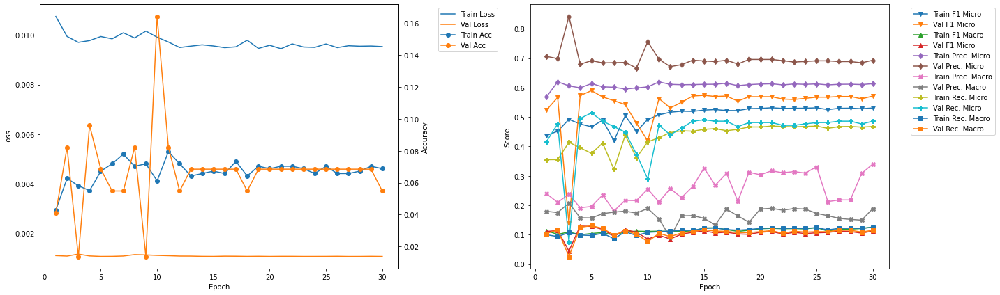

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 62.71
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0473 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4348 	Validation F1 Micro: 0.5779
Train F1 Marco: 0.1094 	Validation F1 Macro: 0.1426
Train Precision Mirco: 0.59 	Validation Precision Micro: 0.6456
Train Precision Marco: 0.217 	Validation Precision Macro: 0.2298
Train Recall Mirco: 0.3442 	Validation Recall Micro: 0.5231
Train Recall Marco: 0.094 	Validation Recall Macro: 0.1414

Epoch 2 	Learning Rate: 0.01 	Time (min): 63.01
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4673 	Validation F1 Micro: 0.5196
Train F1 Marco: 0.1066 	Validation F1 Macro: 0.1145
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.6324
Train Precision Marco: 0.1866 	Validation Precision Macro: 0.179
Train Recall Mirco: 0.3779 	Val

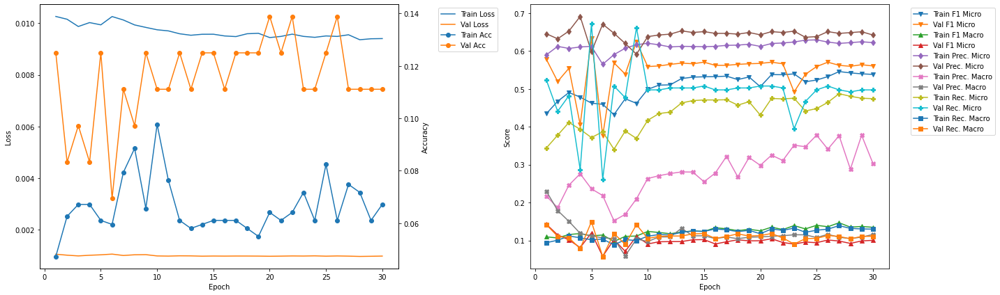

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 71.63
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4485 	Validation F1 Micro: 0.5238
Train F1 Marco: 0.1158 	Validation F1 Macro: 0.1205
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.6037
Train Precision Marco: 0.2452 	Validation Precision Macro: 0.1658
Train Recall Mirco: 0.3543 	Validation Recall Micro: 0.4626
Train Recall Marco: 0.0966 	Validation Recall Macro: 0.1258

Epoch 2 	Learning Rate: 0.01 	Time (min): 71.93
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0687 	Validation Accuracy: 0.0
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.2878
Train F1 Marco: 0.1218 	Validation F1 Macro: 0.097
Train Precision Mirco: 0.6013 	Validation Precision Micro: 0.625
Train Precision Marco: 0.2809 	Validation Precision Macro: 0.186
Train Recall Mirco: 0.4437 	Va

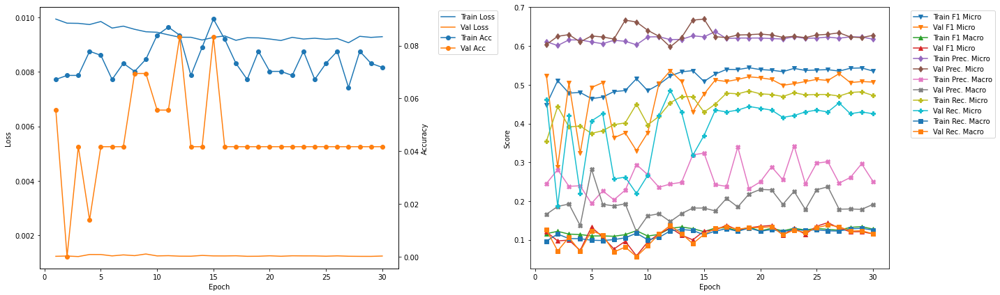

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 80.54
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.0534 	Validation Accuracy: 0.1667
Train F1 Mirco: 0.4417 	Validation F1 Micro: 0.4109
Train F1 Marco: 0.1206 	Validation F1 Macro: 0.0852
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.6463
Train Precision Marco: 0.2749 	Validation Precision Macro: 0.1554
Train Recall Mirco: 0.3444 	Validation Recall Micro: 0.3011
Train Recall Marco: 0.0994 	Validation Recall Macro: 0.0762

Epoch 2 	Learning Rate: 0.01 	Time (min): 80.83
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4977 	Validation F1 Micro: 0.5449
Train F1 Marco: 0.1307 	Validation F1 Macro: 0.1322
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.5759
Train Precision Marco: 0.2939 	Validation Precision Macro: 0.2132
Train Recall Mirco: 0.4

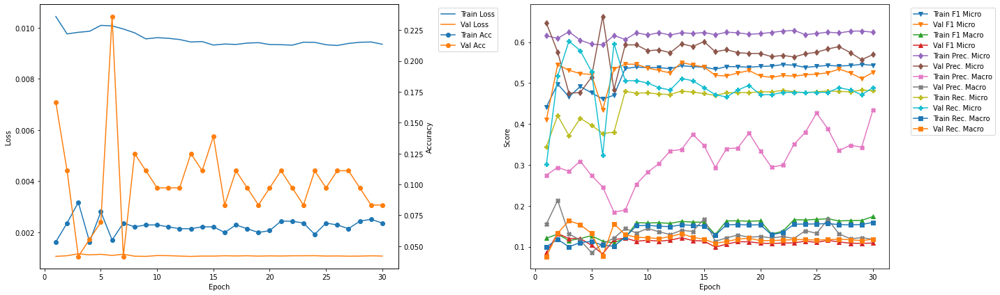

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 5
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4625 	Validation F1 Micro: 0.6329
Train F1 Marco: 0.1119 	Validation F1 Macro: 0.1199
Train Precision Mirco: 0.6124 	Validation Precision Micro: 0.5982
Train Precision Marco: 0.2362 	Validation Precision Macro: 0.1121
Train Recall Mirco: 0.3716 	Validation Recall Micro: 0.6718
Train Recall Marco: 0.1016 	Validation Recall Macro: 0.1494


In [27]:
densenet121LSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = densenet121LSTM_700_1_50, DistilBert = DB_densenet121, 
                                                   training_data = training_data, learning_rate = 0.01, 
                                                   k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0169 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0361 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0364 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1118 	Validation Precision Micro: 0.0
Train Precision Marco: 0.082 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0215 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0428 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.66
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

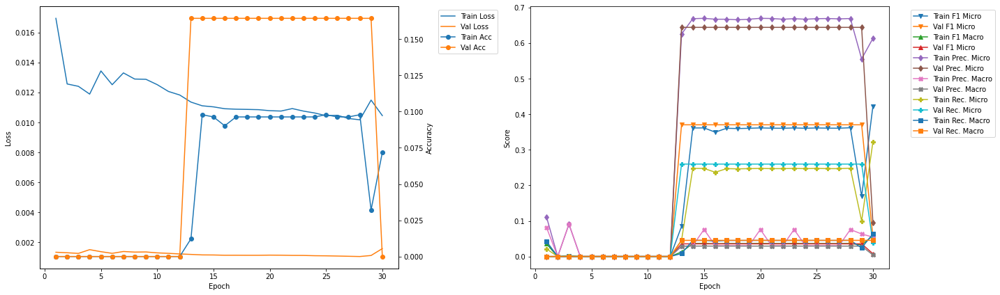

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.16
Train Loss: 0.0134 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0009 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.04 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0018 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0006 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.49
Train Loss: 0.013 	Validation Loss: 0.0016
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.018 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0067 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3556 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0895 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0092 	Validation Recall Micro: 0.0
Train Reca

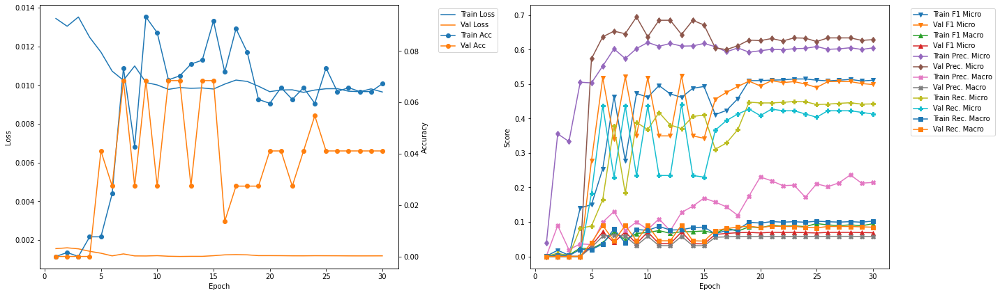

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 20.05
Train Loss: 0.0113 	Validation Loss: 0.0013
Train Accuracy: 0.026 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.2678 	Validation F1 Micro: 0.4783
Train F1 Marco: 0.0483 	Validation F1 Macro: 0.0754
Train Precision Mirco: 0.6176 	Validation Precision Micro: 0.6241
Train Precision Marco: 0.1177 	Validation Precision Macro: 0.0691
Train Recall Mirco: 0.1709 	Validation Recall Micro: 0.3877
Train Recall Marco: 0.0373 	Validation Recall Macro: 0.0912

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.38
Train Loss: 0.0101 	Validation Loss: 0.0013
Train Accuracy: 0.0581 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4779 	Validation F1 Micro: 0.5213
Train F1 Marco: 0.0785 	Validation F1 Macro: 0.0938
Train Precision Mirco: 0.5936 	Validation Precision Micro: 0.5641
Train Precision Marco: 0.1434 	Validation Precision Macro: 0.0768
Train Recall Mirco: 0.4 	

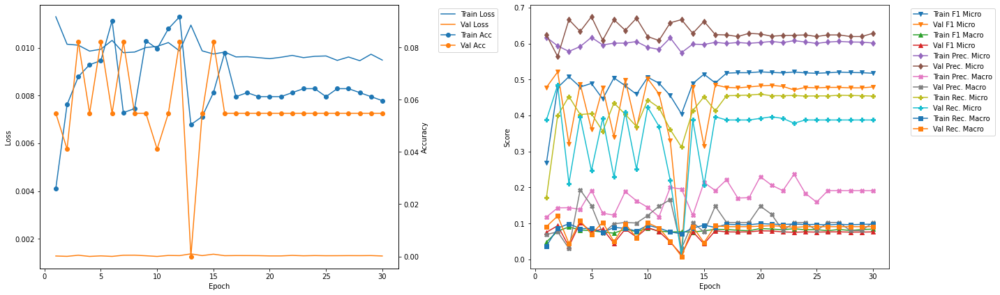

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.88
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4682 	Validation F1 Micro: 0.0385
Train F1 Marco: 0.082 	Validation F1 Macro: 0.0266
Train Precision Mirco: 0.5993 	Validation Precision Micro: 0.8
Train Precision Marco: 0.1827 	Validation Precision Macro: 0.0758
Train Recall Mirco: 0.3842 	Validation Recall Micro: 0.0197
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0172

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.21
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4627 	Validation F1 Micro: 0.4912
Train F1 Marco: 0.0903 	Validation F1 Macro: 0.0809
Train Precision Mirco: 0.5739 	Validation Precision Micro: 0.6043
Train Precision Marco: 0.1745 	Validation Precision Macro: 0.1006
Train Recall Mirco: 0.3876 	Val

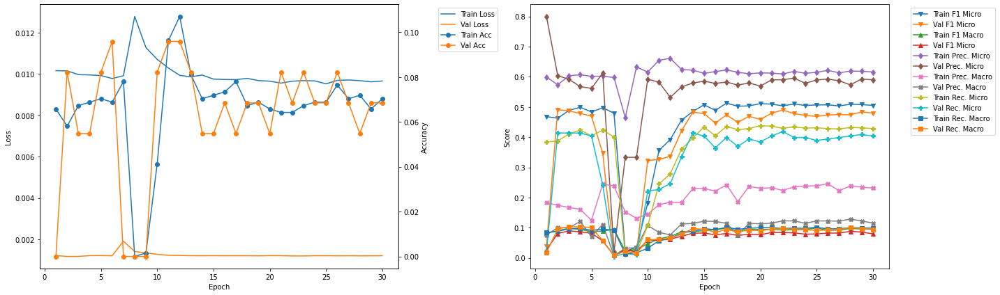

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.7
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4723 	Validation F1 Micro: 0.495
Train F1 Marco: 0.0976 	Validation F1 Macro: 0.0838
Train Precision Mirco: 0.5979 	Validation Precision Micro: 0.6048
Train Precision Marco: 0.178 	Validation Precision Macro: 0.114
Train Recall Mirco: 0.3903 	Validation Recall Micro: 0.419
Train Recall Marco: 0.0925 	Validation Recall Macro: 0.0878

Validation F1 Micro Score Increased (0.523677 --> 0.527607).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.05
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4741 	Validation F1 Micro: 0.5276
Train F1 Marco: 0.0833 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6012 	Validation Precision Micro: 0.585
Train Precision Mar

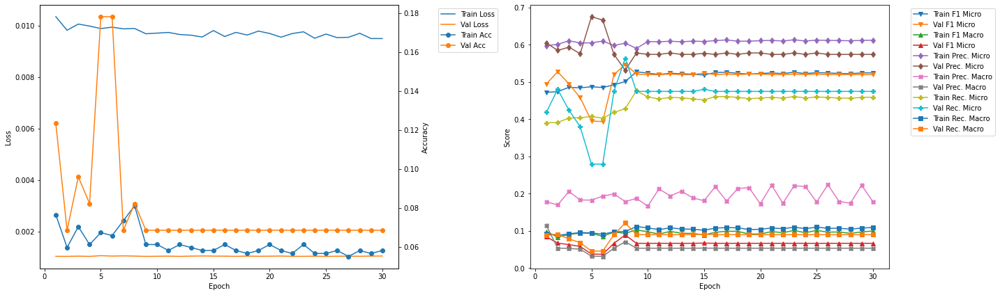

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 49.58
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4847 	Validation F1 Micro: 0.4531
Train F1 Marco: 0.0909 	Validation F1 Macro: 0.073
Train Precision Mirco: 0.6093 	Validation Precision Micro: 0.5426
Train Precision Marco: 0.1828 	Validation Precision Macro: 0.0613
Train Recall Mirco: 0.4024 	Validation Recall Micro: 0.3889
Train Recall Marco: 0.0913 	Validation Recall Macro: 0.0905

Epoch 2 	Learning Rate: 0.01 	Time (min): 49.9
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4887 	Validation F1 Micro: 0.3707
Train F1 Marco: 0.0916 	Validation F1 Macro: 0.0527
Train Precision Mirco: 0.6207 	Validation Precision Micro: 0.6076
Train Precision Marco: 0.1846 	Validation Precision Macro: 0.0665
Train Recall Mirco: 0.4029

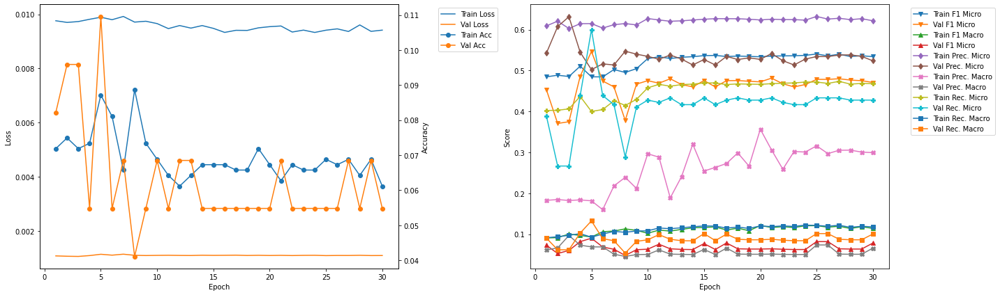

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.4
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4891 	Validation F1 Micro: 0.3915
Train F1 Marco: 0.1124 	Validation F1 Macro: 0.0716
Train Precision Mirco: 0.5917 	Validation Precision Micro: 0.7237
Train Precision Marco: 0.2279 	Validation Precision Macro: 0.1317
Train Recall Mirco: 0.4168 	Validation Recall Micro: 0.2683
Train Recall Marco: 0.1063 	Validation Recall Macro: 0.068

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.73
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0872 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4485 	Validation F1 Micro: 0.5362
Train F1 Marco: 0.0961 	Validation F1 Macro: 0.1204
Train Precision Mirco: 0.6275 	Validation Precision Micro: 0.5952
Train Precision Marco: 0.2667 	Validation Precision Macro: 0.1529
Train Recall Mirco: 0.349 

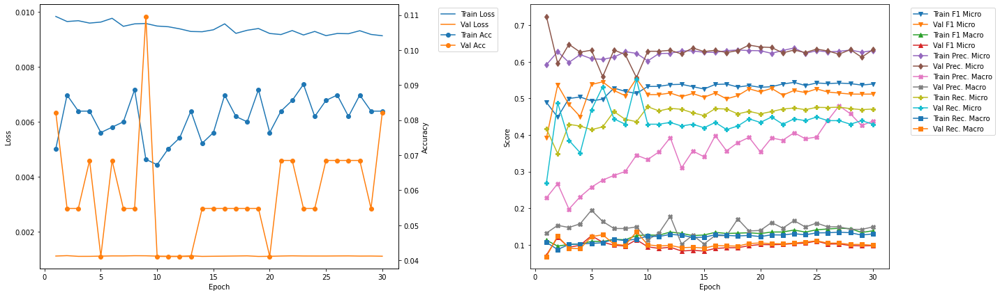

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.25
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0824 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5078 	Validation F1 Micro: 0.5159
Train F1 Marco: 0.1222 	Validation F1 Macro: 0.0899
Train Precision Mirco: 0.6197 	Validation Precision Micro: 0.5956
Train Precision Marco: 0.3427 	Validation Precision Macro: 0.0878
Train Recall Mirco: 0.4302 	Validation Recall Micro: 0.4551
Train Recall Marco: 0.1135 	Validation Recall Macro: 0.1024

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.58
Train Loss: 0.0096 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5119 	Validation F1 Micro: 0.5188
Train F1 Marco: 0.1216 	Validation F1 Macro: 0.0762
Train Precision Mirco: 0.6283 	Validation Precision Micro: 0.5845
Train Precision Marco: 0.4058 	Validation Precision Macro: 0.0988
Train Recall Mirco: 0.4319

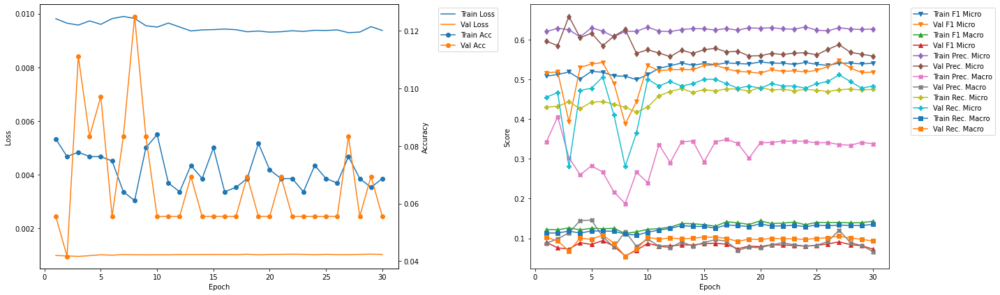

-------------------------------------------
FOLD 9
-------------------------------------------
Validation F1 Micro Score Increased (0.553922 --> 0.625641).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 79.09
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.1806
Train F1 Mirco: 0.511 	Validation F1 Micro: 0.6256
Train F1 Marco: 0.1122 	Validation F1 Macro: 0.1551
Train Precision Mirco: 0.6117 	Validation Precision Micro: 0.5837
Train Precision Marco: 0.2356 	Validation Precision Macro: 0.1679
Train Recall Mirco: 0.4388 	Validation Recall Micro: 0.674
Train Recall Marco: 0.1092 	Validation Recall Macro: 0.177

Epoch 2 	Learning Rate: 0.01 	Time (min): 79.42
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5036 	Validation F1 Micro: 0.5648
Train F1 Marco: 0.1265 	Validation F1 Macro: 0.1291
Train Precision Mirco: 0.596 	Validation Precision Micro: 0.5904
Train Precision 

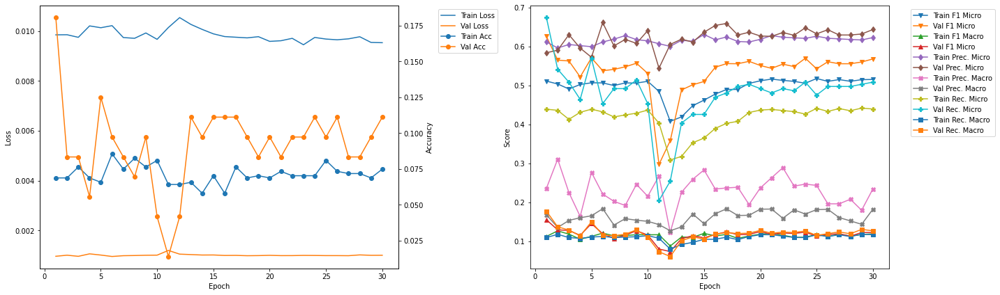

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 88.92
Train Loss: 0.0106 	Validation Loss: 0.0012
Train Accuracy: 0.0519 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.3988 	Validation F1 Micro: 0.4903
Train F1 Marco: 0.0985 	Validation F1 Macro: 0.0829
Train Precision Mirco: 0.5716 	Validation Precision Micro: 0.5535
Train Precision Marco: 0.1482 	Validation Precision Macro: 0.0734
Train Recall Mirco: 0.3062 	Validation Recall Micro: 0.44
Train Recall Marco: 0.0826 	Validation Recall Macro: 0.0955

Epoch 2 	Learning Rate: 0.01 	Time (min): 89.25
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0641 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4885 	Validation F1 Micro: 0.4898
Train F1 Marco: 0.1123 	Validation F1 Macro: 0.1296
Train Precision Mirco: 0.596 	Validation Precision Micro: 0.5874
Train Precision Marco: 0.2659 	Validation Precision Macro: 0.1579
Train Recall Mirco: 0.4139

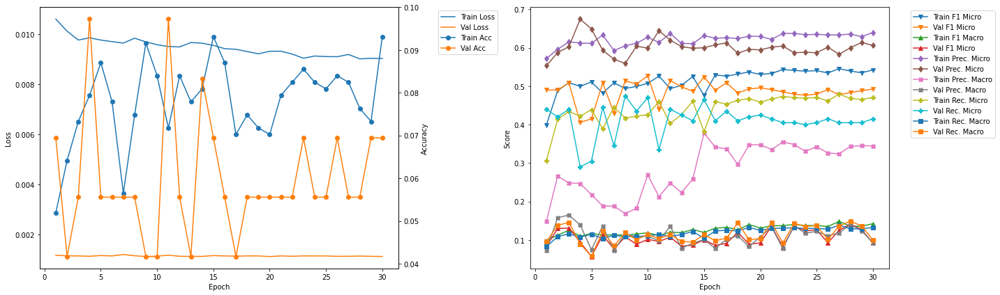

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 1
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.1806
Train F1 Mirco: 0.511 	Validation F1 Micro: 0.6256
Train F1 Marco: 0.1122 	Validation F1 Macro: 0.1551
Train Precision Mirco: 0.6117 	Validation Precision Micro: 0.5837
Train Precision Marco: 0.2356 	Validation Precision Macro: 0.1679
Train Recall Mirco: 0.4388 	Validation Recall Micro: 0.674
Train Recall Marco: 0.1092 	Validation Recall Macro: 0.177


In [28]:
densenet169LSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = densenet169LSTM_700_1_50, DistilBert = DB_densenet169, 
                                                   training_data = training_data, learning_rate = 0.01, k_folds = 10, 
                                                   n_epochs = 30, model_name = 'densenet169LSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0178 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0852 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0582 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1214 	Validation Precision Micro: 0.0
Train Precision Marco: 0.107 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0656 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0609 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.7
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

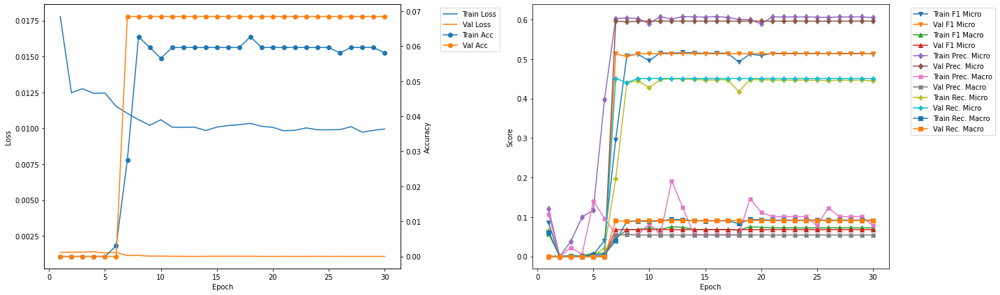

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.513274 --> 0.550725).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 10.81
Train Loss: 0.0114 	Validation Loss: 0.0012
Train Accuracy: 0.052 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.3411 	Validation F1 Micro: 0.5507
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0715
Train Precision Mirco: 0.5342 	Validation Precision Micro: 0.669
Train Precision Marco: 0.1258 	Validation Precision Macro: 0.0608
Train Recall Mirco: 0.2506 	Validation Recall Micro: 0.468
Train Recall Marco: 0.0597 	Validation Recall Macro: 0.0882

Validation F1 Micro Score Increased (0.550725 --> 0.561605).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.18
Train Loss: 0.0104 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4985 	Validation F1 Micro: 0.5616
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0726


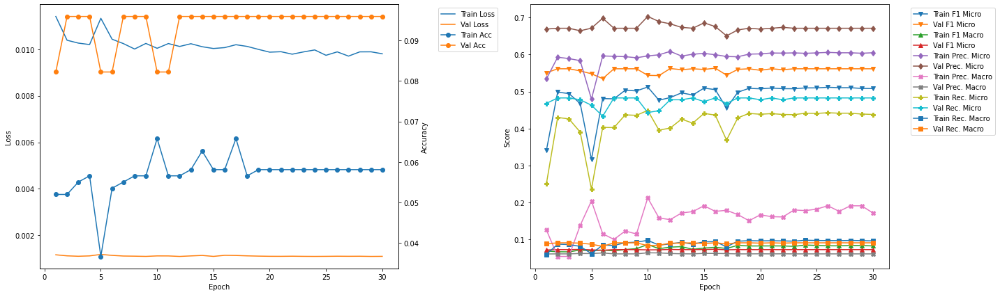

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.32
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5082 	Validation F1 Micro: 0.4529
Train F1 Marco: 0.0773 	Validation F1 Macro: 0.0749
Train Precision Mirco: 0.617 	Validation Precision Micro: 0.531
Train Precision Marco: 0.1696 	Validation Precision Macro: 0.097
Train Recall Mirco: 0.4321 	Validation Recall Micro: 0.3949
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0896

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.66
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.4793
Train F1 Marco: 0.0791 	Validation F1 Macro: 0.0759
Train Precision Mirco: 0.6114 	Validation Precision Micro: 0.5664
Train Precision Marco: 0.1921 	Validation Precision Macro: 0.0967
Train Recall Mirco: 0.4418 	Val

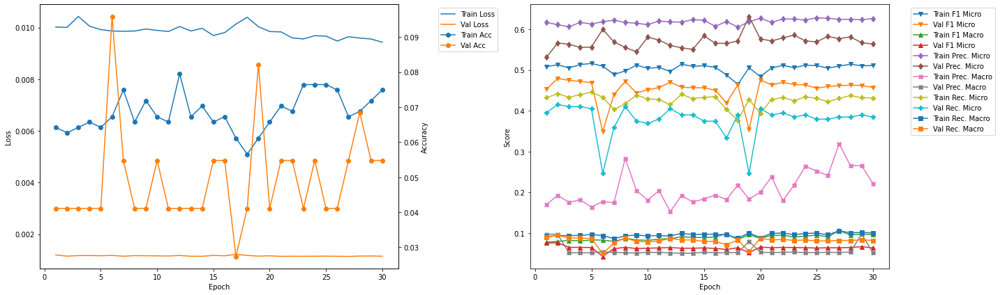

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.76
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.4709
Train F1 Marco: 0.093 	Validation F1 Macro: 0.0745
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.5827
Train Precision Marco: 0.2018 	Validation Precision Macro: 0.0756
Train Recall Mirco: 0.4099 	Validation Recall Micro: 0.3951
Train Recall Marco: 0.0949 	Validation Recall Macro: 0.0919

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.11
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4997 	Validation F1 Micro: 0.4702
Train F1 Marco: 0.0863 	Validation F1 Macro: 0.0752
Train Precision Mirco: 0.6174 	Validation Precision Micro: 0.6031
Train Precision Marco: 0.1728 	Validation Precision Macro: 0.0773
Train Recall Mirco: 0.419

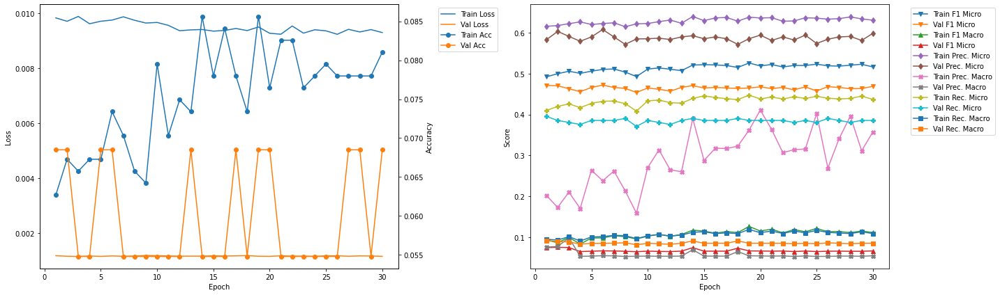

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.21
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0749 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4774 	Validation F1 Micro: 0.5155
Train F1 Marco: 0.0848 	Validation F1 Macro: 0.1261
Train Precision Mirco: 0.6291 	Validation Precision Micro: 0.6385
Train Precision Marco: 0.1904 	Validation Precision Macro: 0.2393
Train Recall Mirco: 0.3846 	Validation Recall Micro: 0.4323
Train Recall Marco: 0.0863 	Validation Recall Macro: 0.1147

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.56
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5032 	Validation F1 Micro: 0.5077
Train F1 Marco: 0.0883 	Validation F1 Macro: 0.087
Train Precision Mirco: 0.6153 	Validation Precision Micro: 0.626
Train Precision Marco: 0.1601 	Validation Precision Macro: 0.1488
Train Recall Mirco: 0.4256 

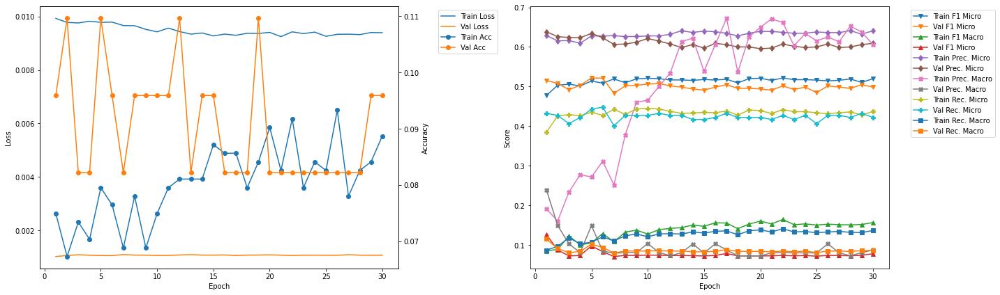

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 52.65
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5101 	Validation F1 Micro: 0.4615
Train F1 Marco: 0.1293 	Validation F1 Macro: 0.077
Train Precision Mirco: 0.6278 	Validation Precision Micro: 0.5639
Train Precision Marco: 0.2942 	Validation Precision Macro: 0.1412
Train Recall Mirco: 0.4296 	Validation Recall Micro: 0.3906
Train Recall Marco: 0.1212 	Validation Recall Macro: 0.0905

Epoch 2 	Learning Rate: 0.01 	Time (min): 53.0
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.515 	Validation F1 Micro: 0.4562
Train F1 Marco: 0.1069 	Validation F1 Macro: 0.0834
Train Precision Mirco: 0.6304 	Validation Precision Micro: 0.5703
Train Precision Marco: 0.3041 	Validation Precision Macro: 0.1416
Train Recall Mirco: 0.4353 	V

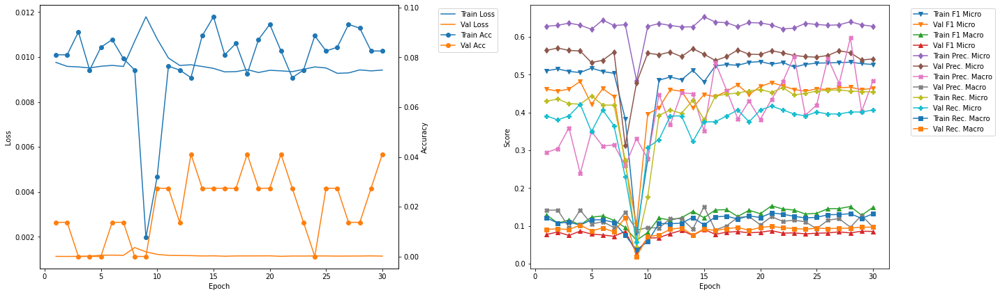

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 63.1
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.1644
Train F1 Mirco: 0.4596 	Validation F1 Micro: 0.5591
Train F1 Marco: 0.105 	Validation F1 Macro: 0.1424
Train Precision Mirco: 0.6219 	Validation Precision Micro: 0.6831
Train Precision Marco: 0.3611 	Validation Precision Macro: 0.2055
Train Recall Mirco: 0.3645 	Validation Recall Micro: 0.4732
Train Recall Marco: 0.0919 	Validation Recall Macro: 0.137

Epoch 2 	Learning Rate: 0.01 	Time (min): 63.45
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4946 	Validation F1 Micro: 0.5105
Train F1 Marco: 0.1131 	Validation F1 Macro: 0.1387
Train Precision Mirco: 0.6021 	Validation Precision Micro: 0.6641
Train Precision Marco: 0.2887 	Validation Precision Macro: 0.1738
Train Recall Mirco: 0.4196 

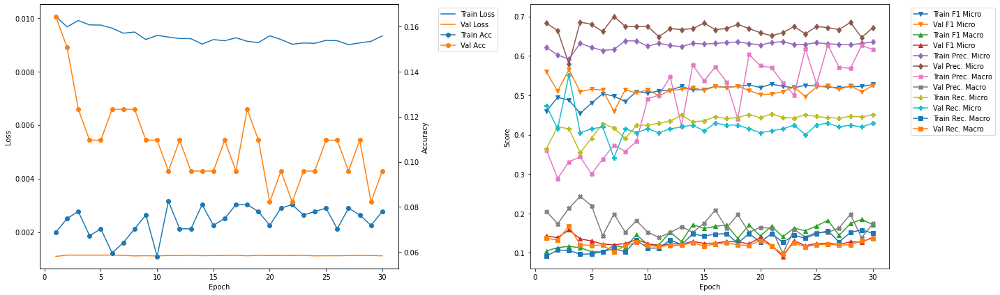

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 73.56
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5067 	Validation F1 Micro: 0.5541
Train F1 Marco: 0.1283 	Validation F1 Macro: 0.1101
Train Precision Mirco: 0.6077 	Validation Precision Micro: 0.6259
Train Precision Marco: 0.4473 	Validation Precision Macro: 0.1633
Train Recall Mirco: 0.4345 	Validation Recall Micro: 0.4971
Train Recall Marco: 0.1172 	Validation Recall Macro: 0.1239

Epoch 2 	Learning Rate: 0.01 	Time (min): 73.91
Train Loss: 0.0097 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4885 	Validation F1 Micro: 0.5615
Train F1 Marco: 0.1223 	Validation F1 Macro: 0.1143
Train Precision Mirco: 0.6342 	Validation Precision Micro: 0.6268
Train Precision Marco: 0.2883 	Validation Precision Macro: 0.1481
Train Recall Mirco: 0.3973

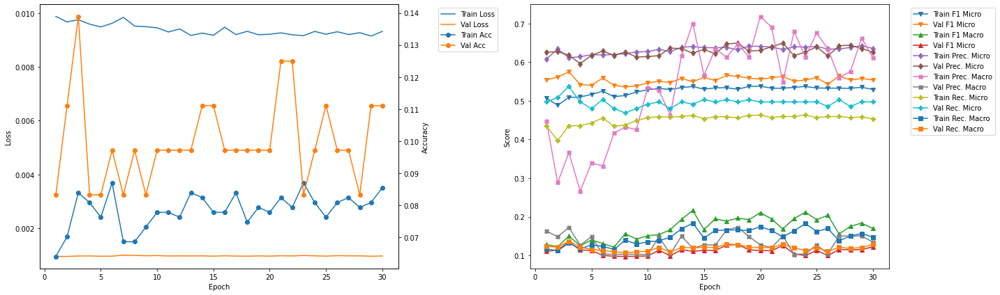

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 84.02
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5037 	Validation F1 Micro: 0.4466
Train F1 Marco: 0.1308 	Validation F1 Macro: 0.1663
Train Precision Mirco: 0.603 	Validation Precision Micro: 0.6
Train Precision Marco: 0.3396 	Validation Precision Macro: 0.2806
Train Recall Mirco: 0.4324 	Validation Recall Micro: 0.3557
Train Recall Marco: 0.1188 	Validation Recall Macro: 0.1519

Epoch 2 	Learning Rate: 0.01 	Time (min): 84.37
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0885 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4784 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.1064 	Validation F1 Macro: 0.2256
Train Precision Mirco: 0.6286 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.2865 	Validation Precision Macro: 0.3029
Train Recall Mirco: 0.3862 	

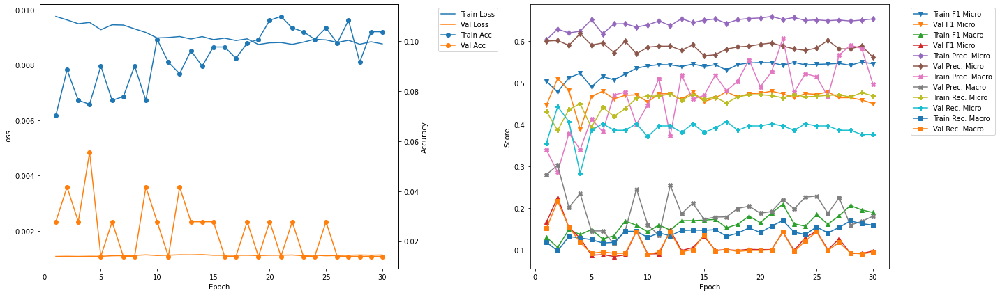

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 94.46
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0855 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4941 	Validation F1 Micro: 0.5404
Train F1 Marco: 0.1314 	Validation F1 Macro: 0.1763
Train Precision Mirco: 0.6353 	Validation Precision Micro: 0.6744
Train Precision Marco: 0.3313 	Validation Precision Macro: 0.2451
Train Recall Mirco: 0.4042 	Validation Recall Micro: 0.4508
Train Recall Marco: 0.113 	Validation Recall Macro: 0.1659

Epoch 2 	Learning Rate: 0.01 	Time (min): 94.81
Train Loss: 0.0094 	Validation Loss: 0.001
Train Accuracy: 0.0809 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.525 	Validation F1 Micro: 0.5079
Train F1 Marco: 0.1424 	Validation F1 Macro: 0.1655
Train Precision Mirco: 0.6217 	Validation Precision Micro: 0.6557
Train Precision Marco: 0.403 	Validation Precision Macro: 0.2074
Train Recall Mirco: 0.4544 	

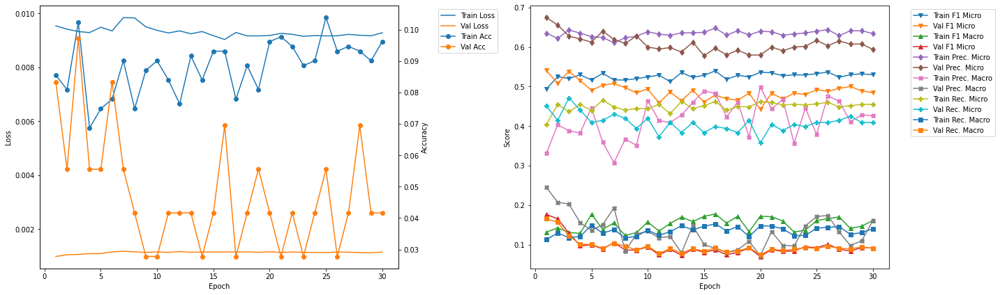

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 3
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.084 	Validation Accuracy: 0.1389
Train F1 Mirco: 0.5087 	Validation F1 Micro: 0.5749
Train F1 Marco: 0.1501 	Validation F1 Macro: 0.1344
Train Precision Mirco: 0.6112 	Validation Precision Micro: 0.6184
Train Precision Marco: 0.3659 	Validation Precision Macro: 0.1725
Train Recall Mirco: 0.4357 	Validation Recall Micro: 0.5371
Train Recall Marco: 0.132 	Validation Recall Macro: 0.1364


In [29]:
densenet201LSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = densenet201LSTM_700_1_50, DistilBert = DB_densenet201, 
                                                   training_data = training_data, learning_rate = 0.01, 
                                                   k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.37
Train Loss: 0.0179 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0568 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0385 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1213 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1183 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0371 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0264 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.74
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

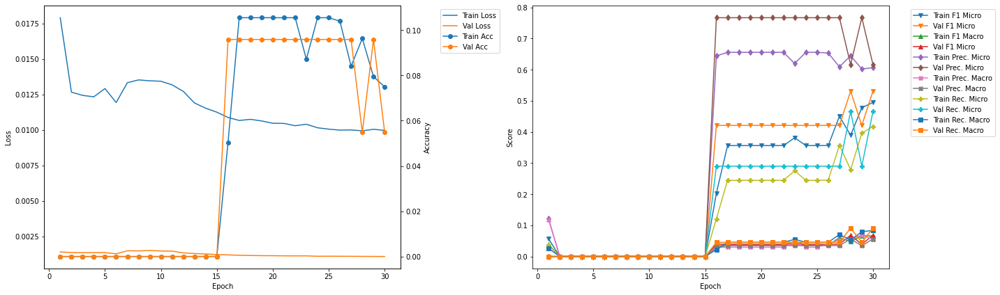

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.46
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0333 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0064 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0171 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0034 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.83
Train Loss: 0.0123 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

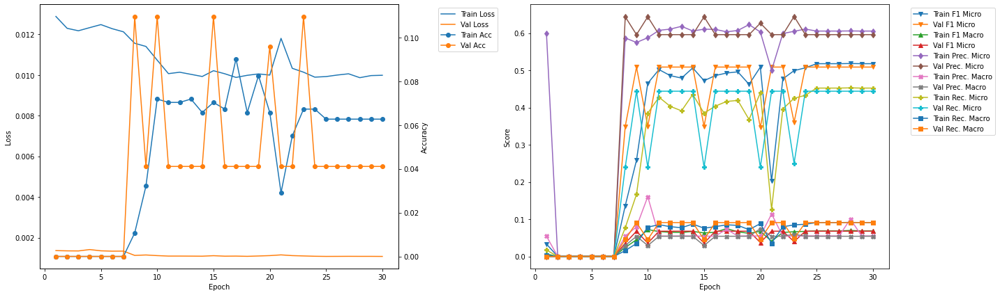

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.48
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5111 	Validation F1 Micro: 0.497
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4383 	Validation Recall Micro: 0.4415
Train Recall Marco: 0.0877 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.85
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.511 	Validation F1 Micro: 0.3448
Train F1 Marco: 0.0735 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.5926 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0681 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4491 	V

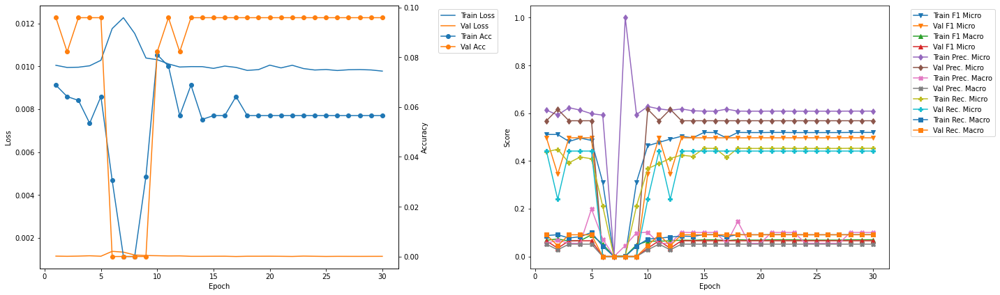

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.5
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4522 	Validation F1 Micro: 0.5176
Train F1 Marco: 0.0743 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.5753 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.1164 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3725 	Validation Recall Micro: 0.4536
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.86
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0856 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.471 	Validation F1 Micro: 0.5207
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6195 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.3799 	V

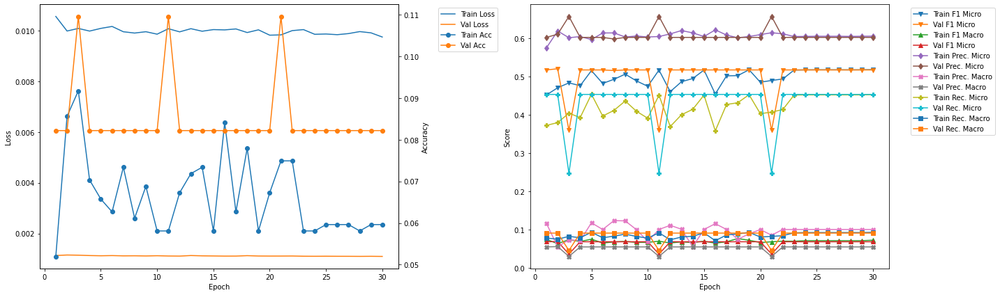

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.51
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4842 	Validation F1 Micro: 0.3602
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0465
Train Precision Mirco: 0.6029 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.0677 	Validation Precision Macro: 0.0741
Train Recall Mirco: 0.4045 	Validation Recall Micro: 0.2513
Train Recall Marco: 0.0811 	Validation Recall Macro: 0.0519

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.88
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4728 	Validation F1 Micro: 0.5045
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0663
Train Precision Mirco: 0.6266 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0523
Train Recall Mirco: 0.379

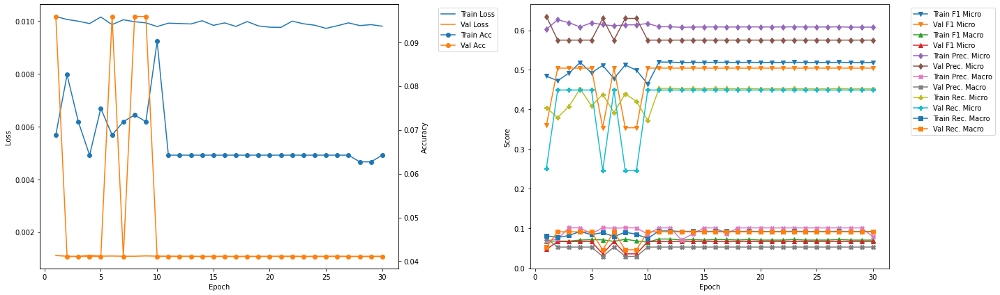

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.53
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4859 	Validation F1 Micro: 0.5296
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0788
Train Precision Mirco: 0.6148 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.0734 	Validation Precision Macro: 0.0806
Train Recall Mirco: 0.4017 	Validation Recall Micro: 0.4541
Train Recall Marco: 0.0809 	Validation Recall Macro: 0.096

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.89
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4922 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0705
Train Precision Mirco: 0.6 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0997 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4172 	Val

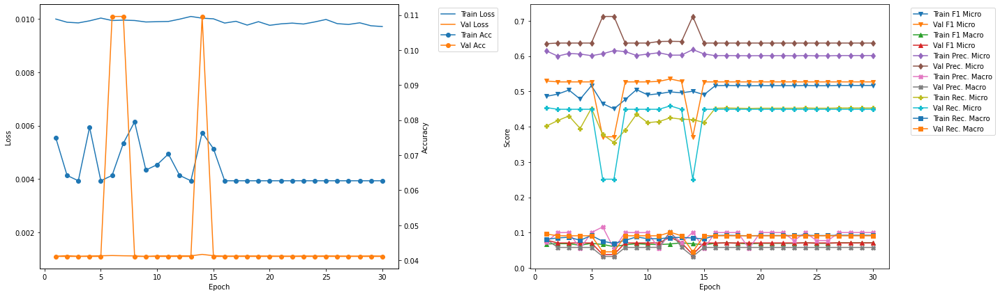

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 66.61
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4723 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0762
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.5878
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0763
Train Recall Mirco: 0.3865 	Validation Recall Micro: 0.4286
Train Recall Marco: 0.0758 	Validation Recall Macro: 0.0966

Epoch 2 	Learning Rate: 0.01 	Time (min): 66.97
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5203 	Validation F1 Micro: 0.4943
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0754
Train Precision Mirco: 0.6059 	Validation Precision Micro: 0.5839
Train Precision Marco: 0.0778 	Validation Precision Macro: 0.0687
Train Recall Mirco: 0.4558 

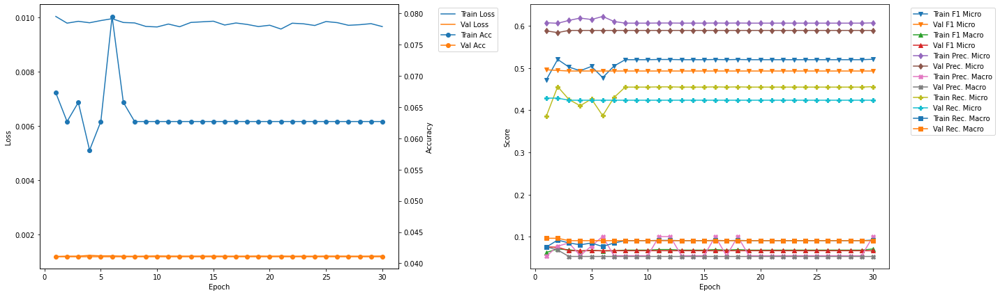

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 77.62
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5037 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.613 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.4274 	Validation Recall Micro: 0.4545
Train Recall Marco: 0.0856 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 77.99
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4958 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0675 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.6119 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.1005 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.4167 	Valida

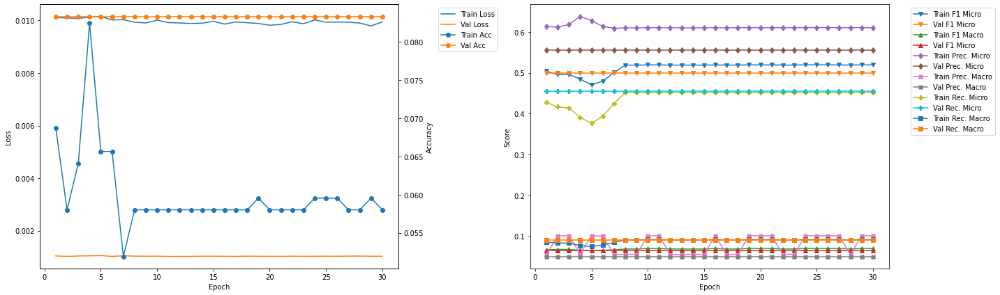

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 88.63
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5017 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0722
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.6597
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.4268 	Validation Recall Micro: 0.4318
Train Recall Marco: 0.0853 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 89.0
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0779 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4781 	Validation F1 Micro: 0.3082
Train F1 Marco: 0.0635 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6044 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.3955 	Va

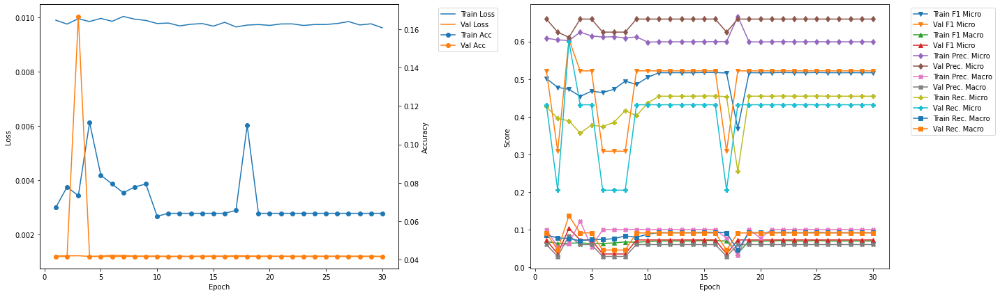

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 99.76
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4856 	Validation F1 Micro: 0.5688
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.6042 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0998 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4059 	Validation Recall Micro: 0.5082
Train Recall Marco: 0.0825 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 100.12
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5089 	Validation F1 Micro: 0.5688
Train F1 Marco: 0.0704 	Validation F1 Macro: 0.0709
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.1002 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4399

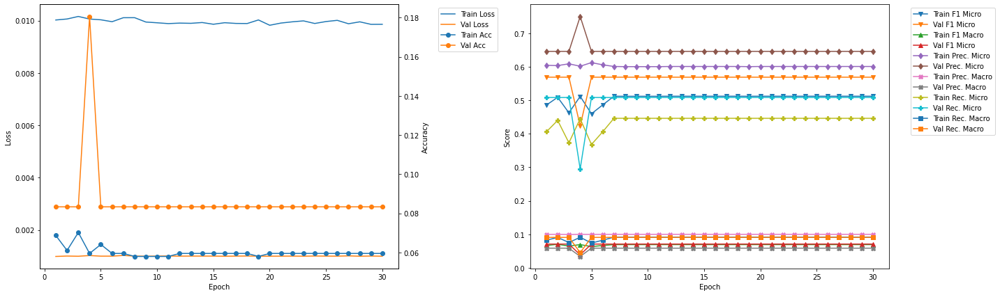

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 3
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0733 	Validation Accuracy: 0.1667
Train F1 Mirco: 0.4729 	Validation F1 Micro: 0.6055
Train F1 Marco: 0.0632 	Validation F1 Macro: 0.1031
Train Precision Mirco: 0.6027 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0627 	Validation Precision Macro: 0.0833
Train Recall Mirco: 0.3891 	Validation Recall Micro: 0.6
Train Recall Marco: 0.0762 	Validation Recall Macro: 0.1364


In [30]:
vgg11bnLSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = vgg11bnLSTM_700_1_50, DistilBert = DB_vgg11bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0169 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0691 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0547 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1468 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1456 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0452 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0438 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.77
Train Loss: 0.0124 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

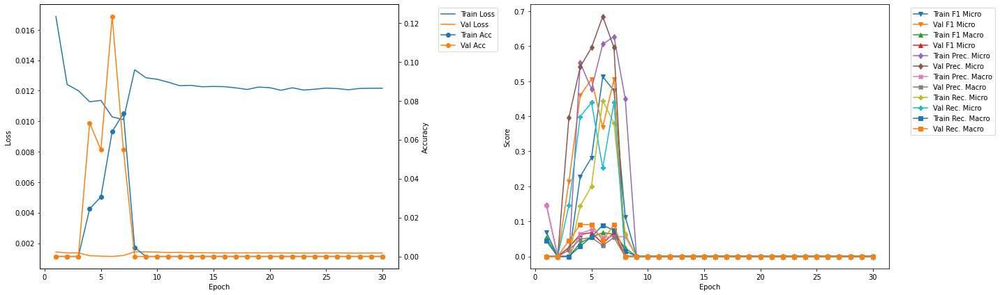

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.95
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.33
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

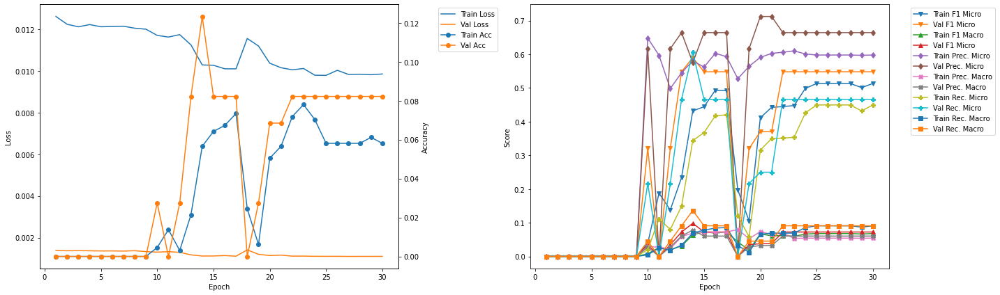

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.48
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.483 	Validation F1 Micro: 0.5098
Train F1 Marco: 0.0767 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.5815 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0724 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.413 	Validation Recall Micro: 0.4313
Train Recall Marco: 0.0859 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.86
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5059 	Validation F1 Micro: 0.338
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.432 	

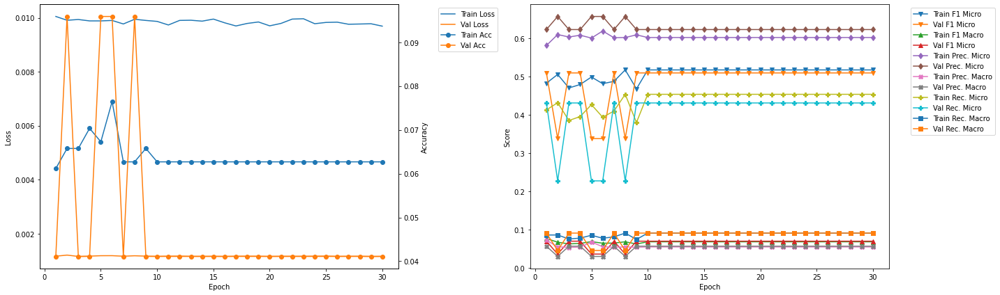

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.97
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0841 	Validation Accuracy: 0.0
Train F1 Mirco: 0.4844 	Validation F1 Micro: 0.0
Train F1 Marco: 0.074 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5958 	Validation Precision Micro: 0.0
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.4081 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 35.35
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.451 	Validation F1 Micro: 0.5279
Train F1 Marco: 0.064 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0726 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3584 	Validation Recall Micro

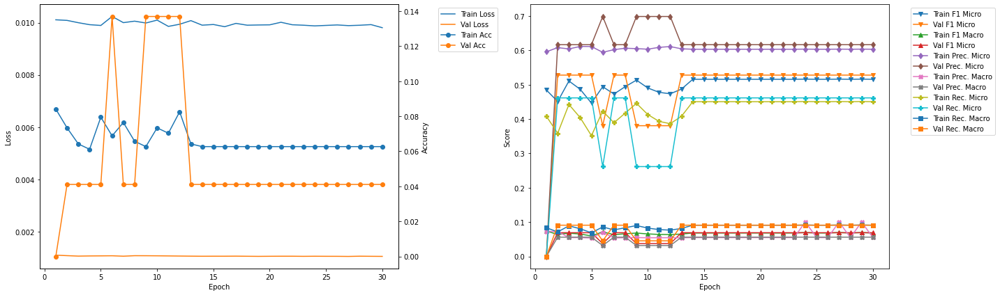

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 46.45
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4578 	Validation F1 Micro: 0.4923
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6129 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0697 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.3654 	Validation Recall Micro: 0.4469
Train Recall Marco: 0.0725 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.83
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.4923
Train F1 Marco: 0.0757 	Validation F1 Macro: 0.0636
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.159 	Validation Precision Macro: 0.0498
Train Recall Mirco: 0.428

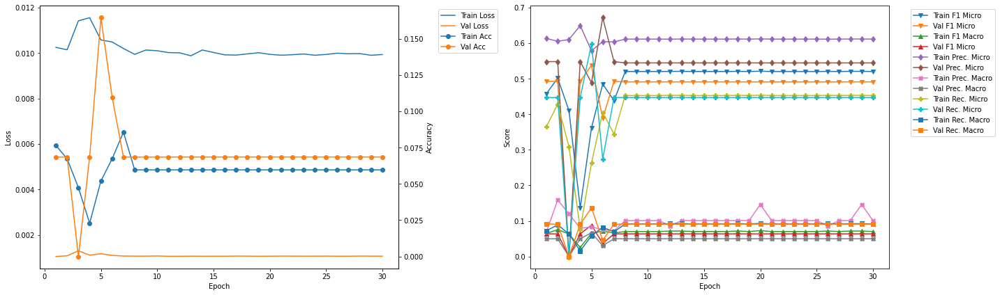

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 57.94
Train Loss: 0.0106 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4533 	Validation F1 Micro: 0.5281
Train F1 Marco: 0.0741 	Validation F1 Macro: 0.0876
Train Precision Mirco: 0.603 	Validation Precision Micro: 0.4932
Train Precision Marco: 0.1205 	Validation Precision Macro: 0.0672
Train Recall Mirco: 0.3631 	Validation Recall Micro: 0.5684
Train Recall Marco: 0.0755 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 58.32
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0917 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4676 	Validation F1 Micro: 0.5298
Train F1 Marco: 0.0713 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.1191 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3813 

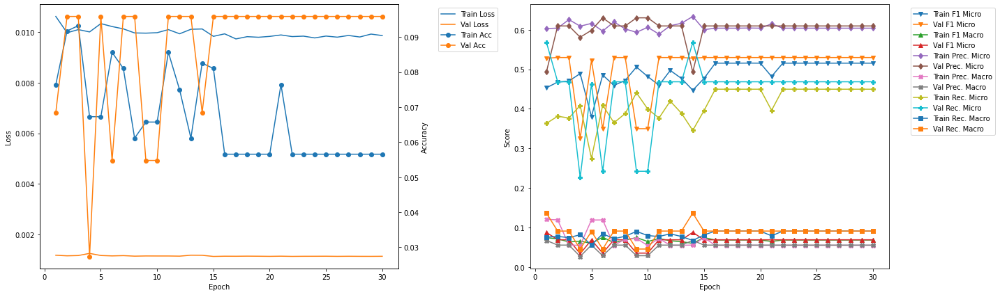

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 69.43
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4568 	Validation F1 Micro: 0.4667
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0622
Train Precision Mirco: 0.5844 	Validation Precision Micro: 0.5274
Train Precision Marco: 0.0689 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.3749 	Validation Recall Micro: 0.4185
Train Recall Marco: 0.0743 	Validation Recall Macro: 0.0885

Epoch 2 	Learning Rate: 0.01 	Time (min): 69.81
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5212 	Validation F1 Micro: 0.4681
Train F1 Marco: 0.0689 	Validation F1 Macro: 0.0625
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.531
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0489
Train Recall Mirco: 0.453

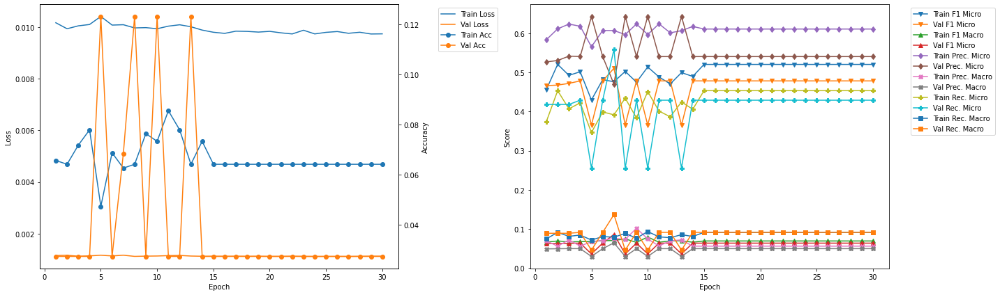

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 80.92
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0412 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.3614 	Validation F1 Micro: 0.5407
Train F1 Marco: 0.0545 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.5704 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0622 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.2645 	Validation Recall Micro: 0.465
Train Recall Marco: 0.054 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 81.3
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.087 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4776 	Validation F1 Micro: 0.3529
Train F1 Marco: 0.064 	Validation F1 Macro: 0.0364
Train Precision Mirco: 0.608 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0303
Train Recall Mirco: 0.3932 	Va

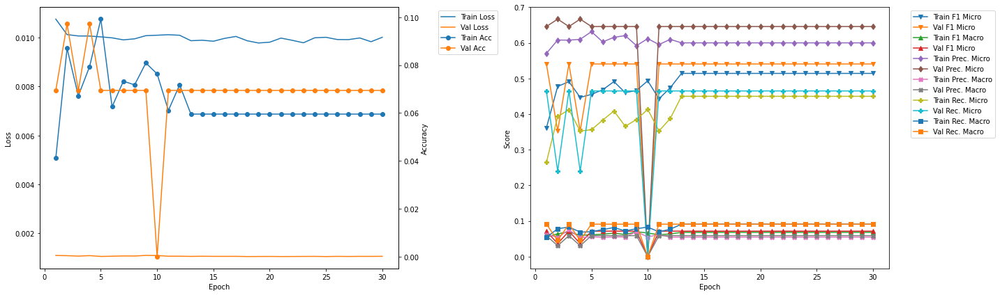

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 92.41
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.464 	Validation F1 Micro: 0.5487
Train F1 Marco: 0.0736 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.5982 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0761 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.379 	Validation Recall Micro: 0.4769
Train Recall Marco: 0.0788 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 92.79
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4725 	Validation F1 Micro: 0.397
Train F1 Marco: 0.0636 	Validation F1 Macro: 0.0385
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.7361
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0335
Train Recall Mirco: 0.3853 	

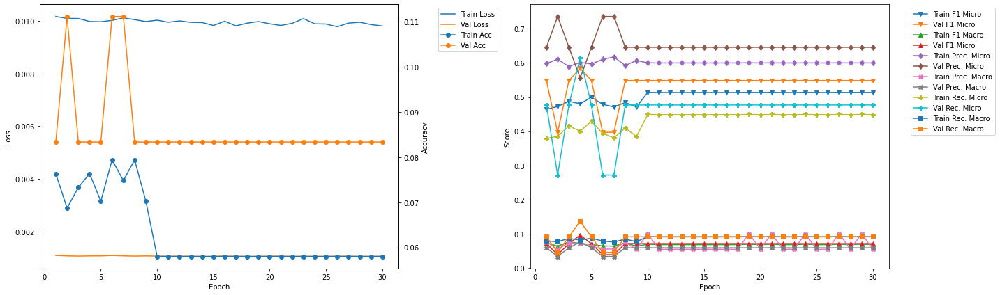

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 103.89
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4788 	Validation F1 Micro: 0.4834
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.6106 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.0677 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.3938 	Validation Recall Micro: 0.4278
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 104.28
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4822 	Validation F1 Micro: 0.4834
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0649
Train Precision Mirco: 0.615 	Validation Precision Micro: 0.5556
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0505
Train Recall Mirco: 0.39

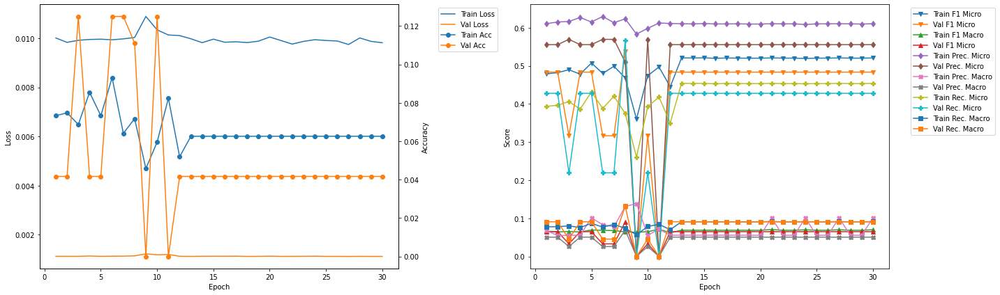

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 14
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4319 	Validation F1 Micro: 0.5902
Train F1 Marco: 0.0639 	Validation F1 Macro: 0.0983
Train Precision Mirco: 0.5806 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0693 	Validation Precision Macro: 0.0785
Train Recall Mirco: 0.3439 	Validation Recall Micro: 0.6058
Train Recall Marco: 0.0692 	Validation Recall Macro: 0.1364


In [31]:
vgg16bnLSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = vgg16bnLSTM_700_1_50, DistilBert = DB_vgg16bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_50_DB')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.39
Train Loss: 0.0165 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.014 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0174 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1161 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0462 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0074 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0123 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.79
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

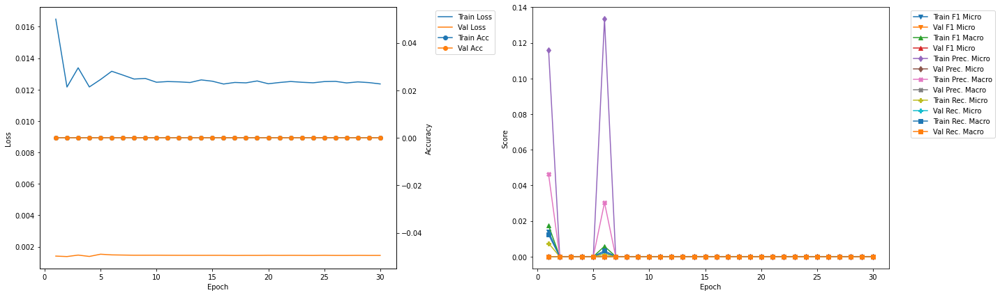

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.16
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.037 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0157 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2288 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1073 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0201 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0098 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.56
Train Loss: 0.0126 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

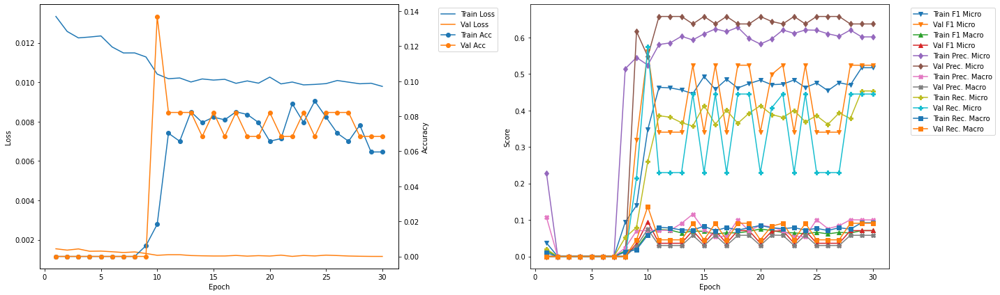

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.560748 --> 0.564841).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 23.99
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4785 	Validation F1 Micro: 0.5648
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0823
Train Precision Mirco: 0.5853 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.1059
Train Recall Mirco: 0.4047 	Validation Recall Micro: 0.49
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0966

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.38
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5041 	Validation F1 Micro: 0.5648
Train F1 Marco: 0.0724 	Validation F1 Macro: 0.0823
Train Precision Mirco: 0.5887 	Validation Precision Micro: 0.6667
Train Precisio

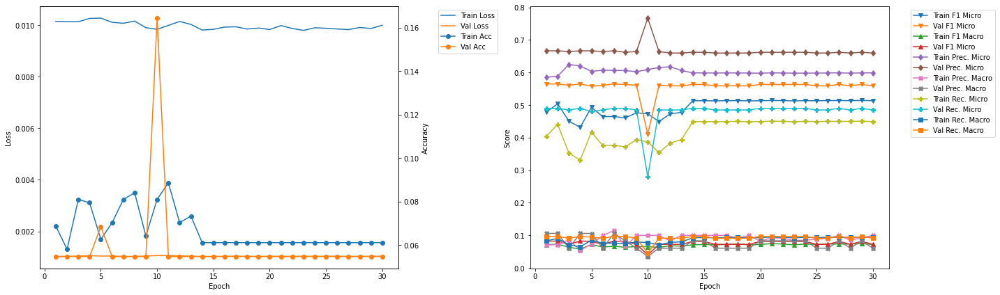

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 35.77
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4789 	Validation F1 Micro: 0.2887
Train F1 Marco: 0.0713 	Validation F1 Macro: 0.0392
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.5467
Train Precision Marco: 0.0893 	Validation Precision Macro: 0.0704
Train Recall Mirco: 0.3959 	Validation Recall Micro: 0.1962
Train Recall Marco: 0.0795 	Validation Recall Macro: 0.0492

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.16
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.4944
Train F1 Marco: 0.0692 	Validation F1 Macro: 0.0748
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5986
Train Precision Marco: 0.0816 	Validation Precision Macro: 0.0996
Train Recall Mirco: 0.414

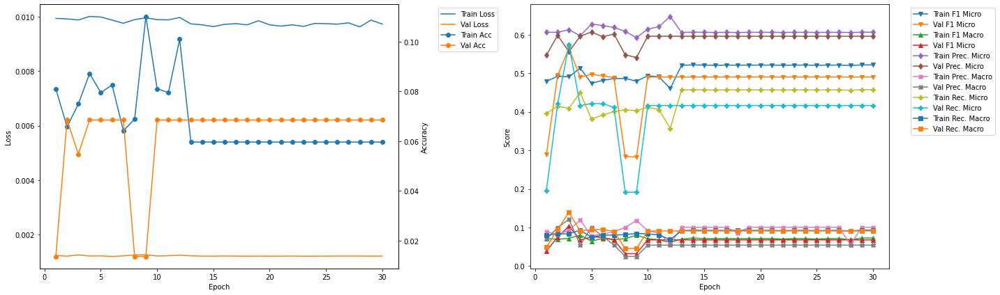

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.55
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.081 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4596 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0818
Train Precision Mirco: 0.6111 	Validation Precision Micro: 0.6149
Train Precision Marco: 0.0745 	Validation Precision Macro: 0.1009
Train Recall Mirco: 0.3683 	Validation Recall Micro: 0.4919
Train Recall Marco: 0.0733 	Validation Recall Macro: 0.0985

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.137
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.3538
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0417
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6133
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0739
Train Recall Mirco: 0.4484 	Va

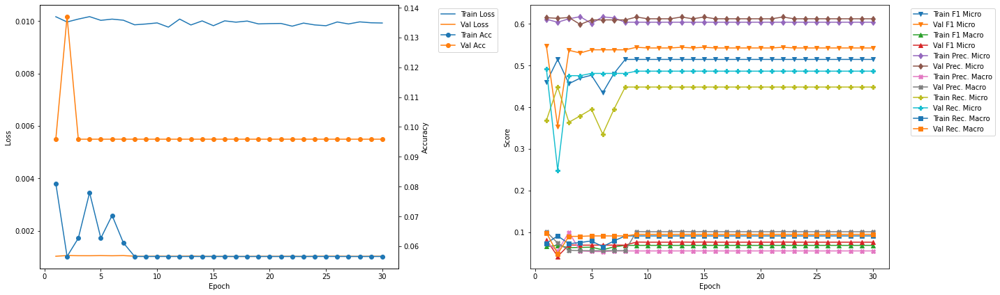

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 59.32
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.522
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.601 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0642 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4315 	Validation Recall Micro: 0.4564
Train Recall Marco: 0.0869 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 59.71
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5053 	Validation F1 Micro: 0.3955
Train F1 Marco: 0.0728 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.5995 	Validation Precision Micro: 0.726
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.4366 	Val

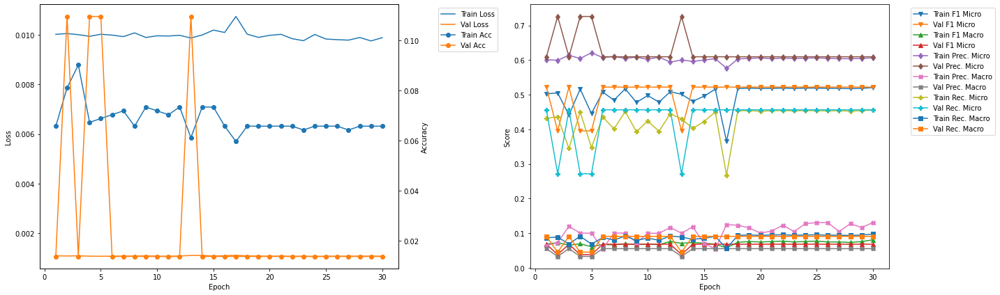

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 71.09
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4693 	Validation F1 Micro: 0.5487
Train F1 Marco: 0.0706 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1354 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3831 	Validation Recall Micro: 0.4819
Train Recall Marco: 0.079 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 71.48
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0856 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.462 	Validation F1 Micro: 0.5487
Train F1 Marco: 0.0662 	Validation F1 Macro: 0.0703
Train Precision Mirco: 0.6214 	Validation Precision Micro: 0.637
Train Precision Marco: 0.1006 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.3677 	Vali

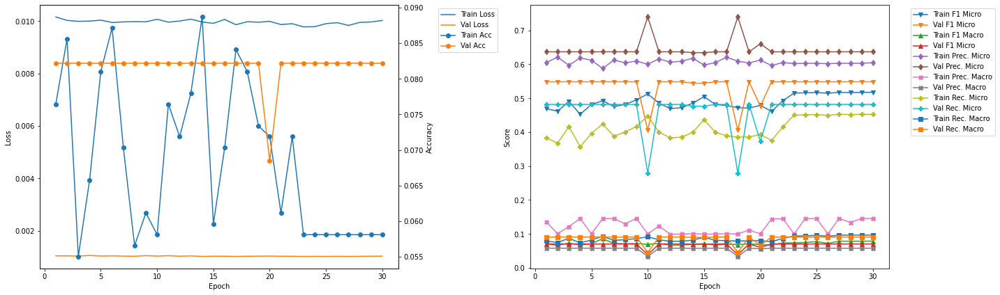

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 82.87
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4783 	Validation F1 Micro: 0.5103
Train F1 Marco: 0.0711 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1301 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3931 	Validation Recall Micro: 0.4416
Train Recall Marco: 0.0809 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 83.26
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4819 	Validation F1 Micro: 0.3723
Train F1 Marco: 0.073 	Validation F1 Macro: 0.0394
Train Precision Mirco: 0.6267 	Validation Precision Micro: 0.6623
Train Precision Marco: 0.1354 	Validation Precision Macro: 0.0407
Train Recall Mirco: 0.3914 	

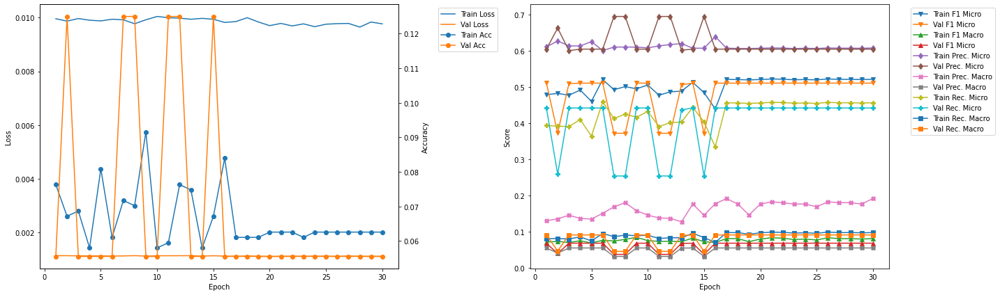

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 94.64
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4933 	Validation F1 Micro: 0.4744
Train F1 Marco: 0.0777 	Validation F1 Macro: 0.0614
Train Precision Mirco: 0.6144 	Validation Precision Micro: 0.5139
Train Precision Marco: 0.16 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.412 	Validation Recall Micro: 0.4405
Train Recall Marco: 0.0878 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 95.03
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5256 	Validation F1 Micro: 0.4728
Train F1 Marco: 0.0853 	Validation F1 Macro: 0.0614
Train Precision Mirco: 0.6165 	Validation Precision Micro: 0.5103
Train Precision Marco: 0.1595 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.4581 	V

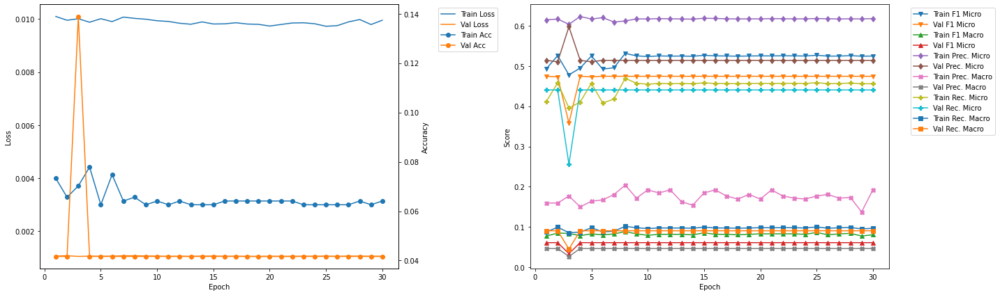

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 106.41
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5056 	Validation F1 Micro: 0.4896
Train F1 Marco: 0.0919 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.195 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.4356 	Validation Recall Micro: 0.4293
Train Recall Marco: 0.0965 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 106.8
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0733 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4809 	Validation F1 Micro: 0.4881
Train F1 Marco: 0.0763 	Validation F1 Macro: 0.0659
Train Precision Mirco: 0.6181 	Validation Precision Micro: 0.5655
Train Precision Marco: 0.1648 	Validation Precision Macro: 0.0518
Train Recall Mirco: 0.3

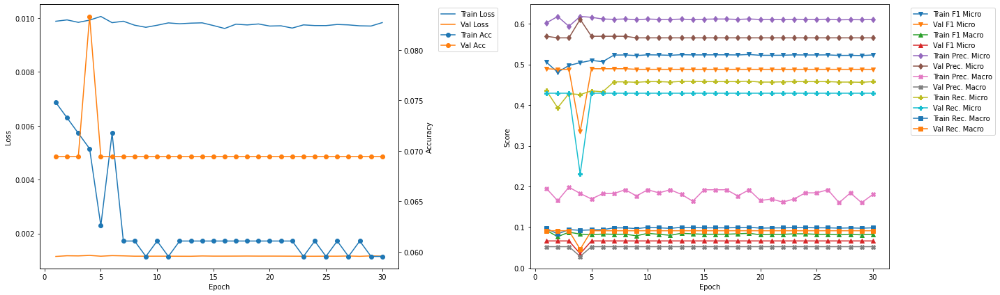

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4785 	Validation F1 Micro: 0.5648
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0823
Train Precision Mirco: 0.5853 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0703 	Validation Precision Macro: 0.1059
Train Recall Mirco: 0.4047 	Validation Recall Micro: 0.49
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0966


In [32]:
vgg19bnLSTM_700_1_50_best = Kfold_train_CNN_RNN_DB(CNN = vgg19bnLSTM_700_1_50, DistilBert = DB_vgg19bn, 
                                               training_data = training_data, learning_rate = 0.01, 
                                               k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_50_DB')

In [33]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 14:47:19


## Training Summary

### Summary Table

In [34]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_50_best,
    'ResNet50' : resnet50LSTM_700_1_50_best,
    'ResNet101' : resnet101LSTM_700_1_50_best,
    'DenseNet121' : densenet121LSTM_700_1_50_best,
    'DenseNet169' : densenet169LSTM_700_1_50_best,
    'DenseNet201' : densenet201LSTM_700_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,3.000000,2.000000,4.000000,8.000000,9.000000,8.000000,9.000000,2.000000,3.000000
Epoch,1.000000,12.000000,1.000000,5.000000,1.000000,3.000000,3.000000,14.000000,1.000000
Train Loss,0.010157,0.009956,0.009812,0.009936,0.009845,0.009753,0.009953,0.010281,0.010150
Train Accuracy,0.076453,0.070336,0.064220,0.061069,0.068702,0.083969,0.073282,0.056575,0.068807
Train F1 Micro,0.469136,0.499326,0.471248,0.462522,0.511045,0.508731,0.472906,0.431925,0.478511
Train F1 Macro,0.063253,0.066444,0.063425,0.111885,0.112183,0.150093,0.063179,0.063914,0.071429
Train Precision Micro,0.614035,0.600973,0.606498,0.612418,0.611681,0.611243,0.602691,0.580583,0.585265
Train Precision Macro,0.054676,0.054310,0.054115,0.236237,0.235624,0.365895,0.062702,0.069274,0.070307
Train Recall Micro,0.379566,0.427089,0.385321,0.371575,0.438845,0.435666,0.389114,0.343876,0.404694
Train Recall Macro,0.075499,0.085630,0.076883,0.101608,0.109242,0.132038,0.076165,0.069174,0.083111


In [35]:
summaryDF.to_csv('BestCnnRnnDBModels/BestModels_700_1_50.csv')

### Training Summary Graph

In [36]:
import plotly
import plotly.graph_objects as go

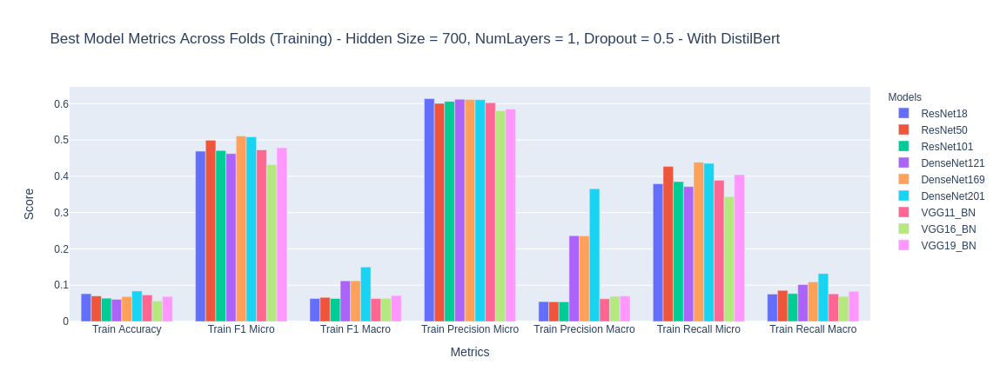

In [37]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0.5 - With DistilBert',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

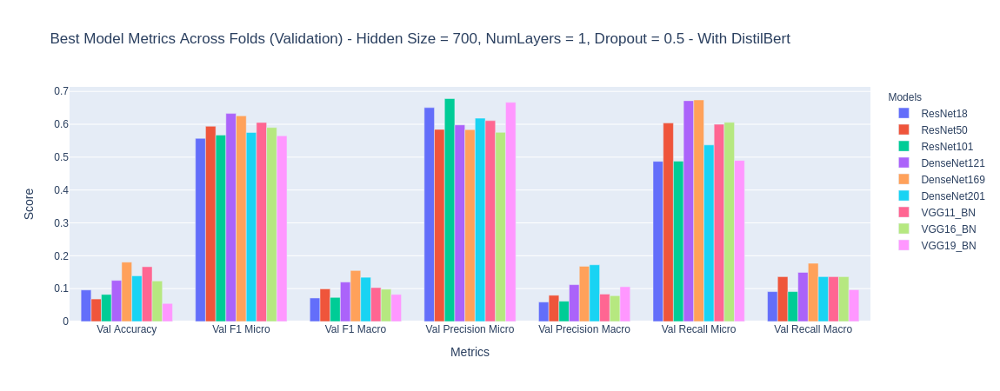

In [38]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0.5 - With DistilBert',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

# 
# 
# 